<a href="https://colab.research.google.com/github/Fahrizp24/PCVK_Ganjil_2025/blob/main/Pertemuan9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **1. Import beberapa library berikut yang akan digunakan selama uji coba praktikum**

In [22]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

### **2. Buat Global Threshold (BINARY, BINARY_INV, TRUNC, TOZERO, TOZERO_INV), dengan threshold= 170, secara manual**

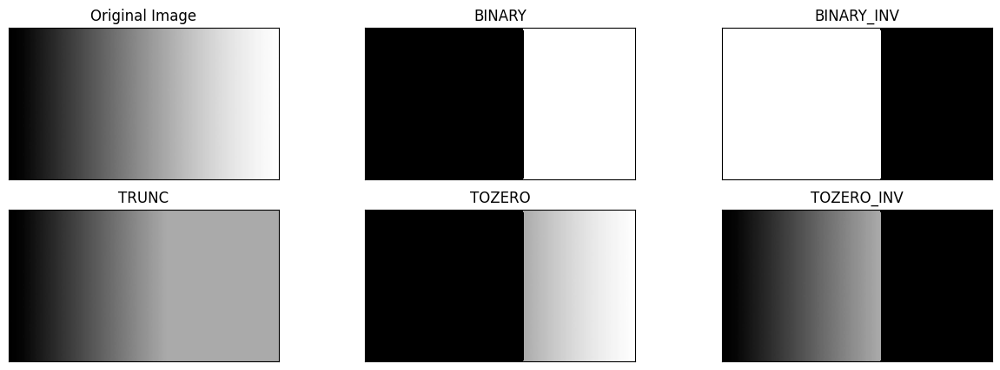

In [23]:
filename = ('/content/drive/MyDrive/Colab Notebooks/PCVK/images/gradient.jpg')
img = cv.imread(filename)
thresh1 = cv.imread(filename)
thresh2 = cv.imread(filename)
thresh3 = cv.imread(filename)
thresh4 = cv.imread(filename)
thresh5 = cv.imread(filename)
thresh = 170 #nilai Threshold yang ditentukan
#1. thresh1 jika pixel di img>127, maka thresh1 bernilai 1(putih) selain itu bernilai 0(hitam)
thresh1[img>thresh] = 255 #tanpa library
thresh1[img<=thresh] = 0
#2. thresh2 adalah binary threshold inverse
thresh2 = 255 - thresh1 #tanpa library
#3. Threshold Truncate
thresh3[img>thresh] = thresh #tanpa library
#4. Threshold Tozero
thresh4[img<=thresh] = 0 #tanpa library
#5. Threshold Tozero Inverse
thresh5[img>thresh] = 0 #tanpa library
titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
plt.figure(figsize = (15,5))
for i in range(len(images)):
  plt.subplot(2,3,i+1),plt.imshow(images[i],'gray', interpolation='nearest')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

### **3. Buat Otsu Thresholding tanpa menggunakan Library. Tampilkan juga nilai thresholdsaat anda gunakan Otsu’s**

Otsu's threshold found: 130


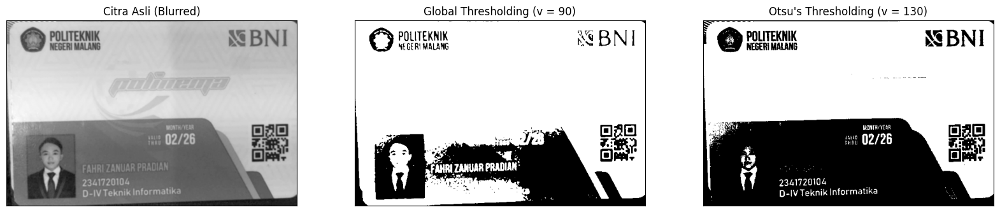

In [24]:
filename = ('/content/drive/MyDrive/Colab Notebooks/PCVK/images/KTM Fahri.png')
img = cv.imread(filename, 0)
blur = cv.GaussianBlur(img, (5, 5), 0)

def otsu(gray):
    pixel_number = gray.shape[0] * gray.shape[1]
    mean_weight = 1.0 / pixel_number
    his, bins = np.histogram(gray, np.arange(0, 257))
    final_thresh = -1
    final_value = -1
    intensity_arr = np.arange(256)

    for t in bins[1:-1]:  # This goes from 1 to 254 uint8 range (Pretty sure wont be those values)
        pcb = np.sum(his[:t])
        pcf = np.sum(his[t:])
        Wb = pcb * mean_weight
        Wf = pcf * mean_weight

        # Handle potential division by zero
        if pcb == 0 or pcf == 0:
            continue

        mub = np.sum(intensity_arr[:t] * his[:t]) / float(pcb)
        muf = np.sum(intensity_arr[t:] * his[t:]) / float(pcf)

        value = Wb * Wf * (mub - muf) ** 2

        if value > final_value:
            final_thresh = t
            final_value = value

    final_img = gray.copy()
    print(f"Otsu's threshold found: {final_thresh}")
    final_img[gray > final_thresh] = 255
    final_img[gray <= final_thresh] = 0  # Use <= to ensure all pixels are set
    return final_img, final_thresh

otsu_biner, otsu_thresh = otsu(img)
x = f"Otsu's Thresholding (v = {otsu_thresh})"

ret, th1 = cv.threshold(blur, 90, 255, cv.THRESH_BINARY)
# ret,th2 = cv.threshold(blur,thresh,255,cv.THRESH_BINARY)

titles = ['Citra Asli (Blurred)', 'Global Thresholding (v = 90)', x]
citra3 = [blur, th1, otsu_biner]

plt.figure(figsize=(20, 15))
for i in range(len(citra3)):
    plt.subplot(1, 3, i + 1)
    plt.imshow(citra3[i], 'gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()

### **4. Buat histogram dari citra tersegmentasi**

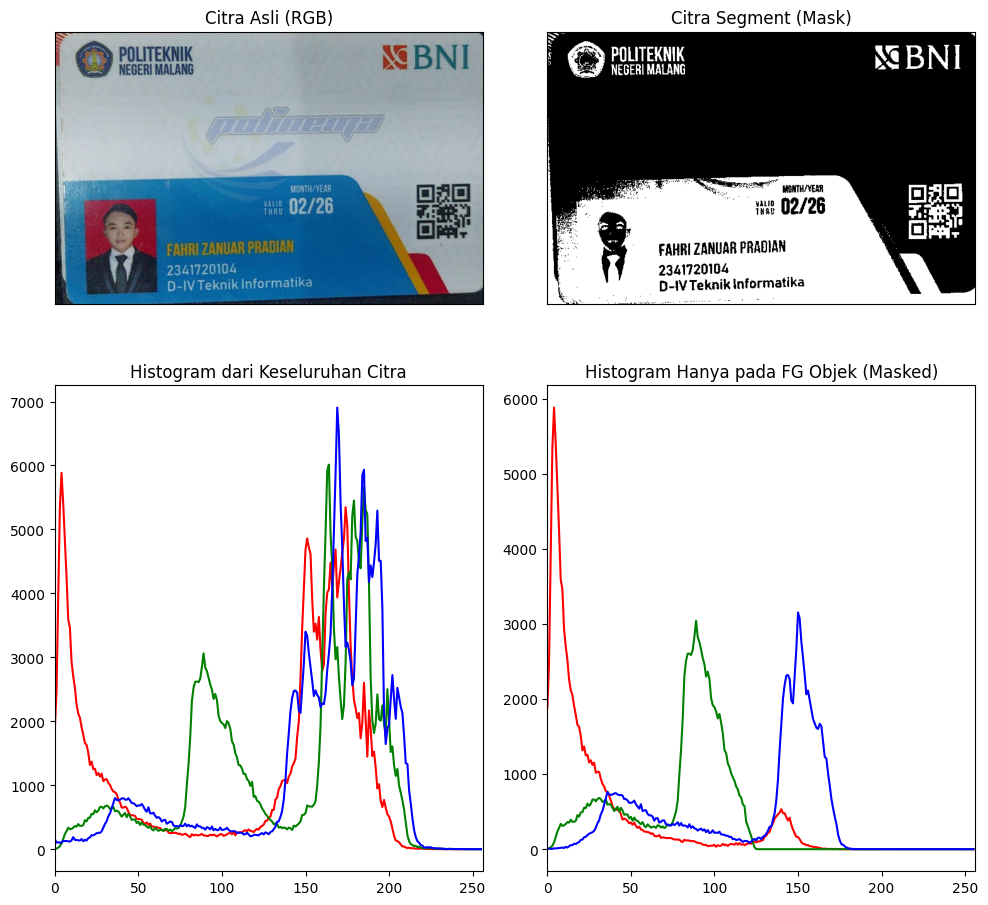

In [25]:
# 1. Muat Gambar
# Tentukan path file
filename = ('/content/drive/MyDrive/Colab Notebooks/PCVK/images/KTM Fahri.png')

# Muat gambar asli (format BGR)
img_bgr = cv.imread(filename)

# Buat versi Grayscale untuk thresholding (masking)
img_gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)

# Buat versi RGB untuk plotting (agar warna tampil benar di Matplotlib)
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# 2. Buat Mask (Citra Segment)
# Lakukan thresholding untuk memisahkan objek dari background
# Objek akan berwarna putih (255), background hitam (0)
ret3, mask = cv.threshold(img_gray, 100, 255, cv.THRESH_BINARY_INV)

# 3. Siapkan Plot
plt.figure(figsize=(10, 10))

# --- Plot 1: Citra Asli ---
plt.subplot(2, 2, 1)
plt.imshow(img_rgb)
plt.title('Citra Asli (RGB)')
plt.xticks([]), plt.yticks([]) # Sembunyikan sumbu x/y

# --- Plot 2: Citra Segment (Mask) ---
plt.subplot(2, 2, 2)
plt.imshow(mask, 'gray')
plt.title('Citra Segment (Mask)')
plt.xticks([]), plt.yticks([])

# 4. Hitung dan Plot Histogram
color = ('r', 'g', 'b')

# --- Plot 3: Histogram Keseluruhan Citra ---
plt.subplot(2, 2, 3)
plt.title('Histogram dari Keseluruhan Citra')
for i, col in enumerate(color):
    # Hitung histogram untuk channel i, tanpa mask
    # Gunakan img_rgb karena Matplotlib dan cv.calcHist[RGB] konsisten
    hist_full = cv.calcHist([img_rgb], [i], None, [256], [0, 256])
    plt.plot(hist_full, color=col)
plt.xlim([0, 256])

# --- Plot 4: Histogram dari Citra Segment ---
plt.subplot(2, 2, 4)
plt.title('Histogram Hanya pada FG Objek (Masked)')
for i, col in enumerate(color):
    # Hitung histogram untuk channel i, HANYA pada area mask (putih)
    hist_masked = cv.calcHist([img_rgb], [i], mask, [256], [0, 256])
    plt.plot(hist_masked, color=col)
plt.xlim([0, 256])

# Tampilkan semua plot
plt.tight_layout()
plt.show()

### **5. Lakukan segmentasi warna pada image " ktp Riyanto.jpg ", munculkan hanya warna yang biru saja. (Petunjuk: anda dapat gunakan K-Means untuk menampilkan hanya warna tertentu saja)**

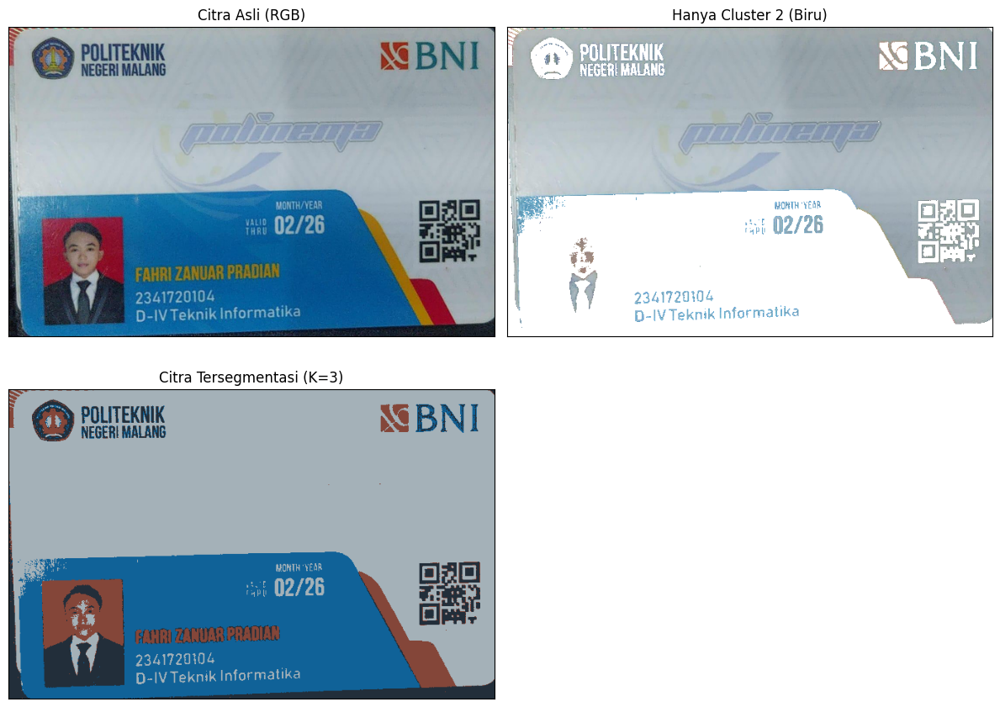

In [26]:
# 1. Muat dan Persiapkan Gambar
filename = ('/content/drive/MyDrive/Colab Notebooks/PCVK/images/KTM Fahri.png')

# Muat gambar (OpenCV memuat sebagai BGR)
img_bgr = cv.imread(filename)

# Konversi ke RGB untuk plotting (Matplotlib mengharapkan RGB)
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# 2. Persiapkan Data untuk K-Means
# Ubah gambar menjadi array 2D (jumlah_piksel x 3 channel)
pixel_values = img_rgb.reshape((-1, 3))
# Konversi ke float32 sesuai kebutuhan cv.kmeans
pixel_values = np.float32(pixel_values)

# 3. Tentukan Kriteria dan Jalankan K-Means
# Tentukan kriteria berhenti: 150 iterasi ATAU epsilon (akurasi) 0.1
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 150, 0.1)

# Tentukan jumlah cluster (K)
k = 4
# Jalankan K-Means
# compactness: Jumlah kuadrat jarak dari setiap titik ke pusat clusternya
# labels: Array label cluster untuk setiap piksel (misal: 0, 1, atau 2)
# centers: Titik pusat (centroid) dari setiap cluster (warna rata-rata)
compactness, labels, (centers) = cv.kmeans(
    pixel_values,
    k,
    None,
    criteria,
    10,
    cv.KMEANS_RANDOM_CENTERS
)

# 4. Buat Gambar Hasil Segmentasi
# Konversi warna centroid (float) kembali ke integer uint8
centers = np.uint8(centers)

# Petakan setiap piksel ke warna centroid clusternya
segmented_data = centers[labels.flatten()]

# Bentuk ulang (reshape) data piksel kembali ke dimensi gambar asli
segmented_image = segmented_data.reshape(img_rgb.shape)

# 5. Isolasi Cluster Biru (Masking)
# Salin gambar asli untuk membuat gambar masked
masked_image = np.copy(img_rgb)
# Ubah ke 2D untuk manipulasi piksel
masked_image_flat = masked_image.reshape((-1, 3))

# **Asumsi:** Cluster 1 adalah cluster biru.
# Anda mungkin perlu mengubah angka '1' ini (bisa 0, 1, atau 2)
# tergantung hasil K-Means.
cluster_to_show = 2

# Ubah semua piksel yang BUKAN cluster 1 menjadi putih [255, 255, 255]
masked_image_flat[labels.flatten() != cluster_to_show] = [255, 255, 255]

# Bentuk ulang kembali ke gambar
masked_image = masked_image_flat.reshape(img_rgb.shape)

# 6. Tampilkan Hasil
plt.figure(figsize=(12, 9))

plt.subplot(2, 2, 1)
plt.imshow(img_rgb)
plt.title('Citra Asli (RGB)')
plt.xticks([]), plt.yticks([])

plt.subplot(2, 2, 2)
plt.imshow(masked_image)
plt.title(f'Hanya Cluster {cluster_to_show} (Biru)')
plt.xticks([]), plt.yticks([])

plt.subplot(2, 2, 3)
plt.imshow(segmented_image)
plt.title('Citra Tersegmentasi (K=3)')
plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()

### **6. Proses konversi gambar KTP menjadi teks yang dapat mengenali tulisan.**

In [27]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr-ind

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr-ind is already the newest version (1:4.00~git30-7274cfa-1.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.


In [28]:
# 2. Menambahkan axis kedalam objek figure dengan method add_subplot(). kemudian
# kita tunjukan objek figure kita dengan method show()
def display(img,cmap='gray'):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')
    plt.show() # Add plt.show() here

In [29]:
# 3. Python-tesseract akan mencetak teks yang dikenali dan menyimpannya kedalam file
import pytesseract
from pytesseract import Output
img = cv.imread('/content/drive/My Drive/Colab Notebooks/PCVK/images/KTM Fahri.png')
# Convert the image to RGB before drawing rectangles to display in color
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
d = pytesseract.image_to_data(mask, output_type=Output.DICT)
print(d.keys())
print(d['text'])

dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])
['', '', '', '', 'ye', 'O08', '', '', '', 'FAHRI', 'ZANUAR', 'PRADIAN', '', '', '', '2341720164', '', 'D-IV', 'Teknik', 'Informatika', '', '', '', '']


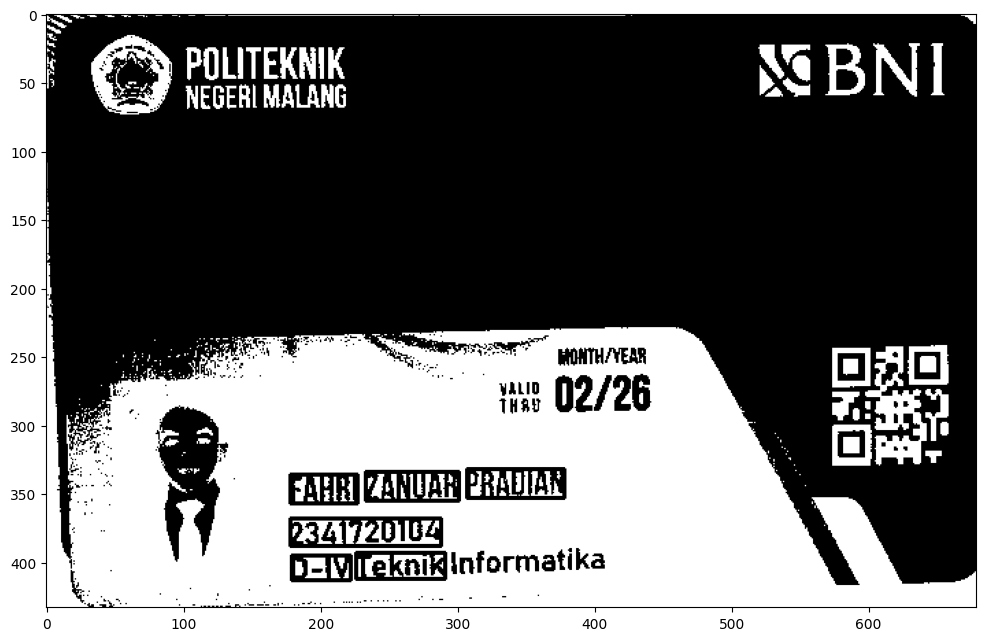

dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])


In [30]:
# 4. Menambahkan kotak untuk deteksi teksi pada gambar
n_boxes = len(d['text']) # Change text1 to d
for i in range(n_boxes):
    # Add a check for empty strings or None values in 'text'
    if int(d['conf'][i]) > 60 and d['text'][i] != '' and d['text'][i] is not None: # Change text1 to d and add checks
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i]) # Change text1 to d
        mask = cv.rectangle(mask, (x, y), (x + w, y + h), (0, 255, 0), 2) # Change mask to mask and cv2 to cv

# Display the image with bounding boxes after the loop
display(mask) # Call display with mask
print(d.keys())


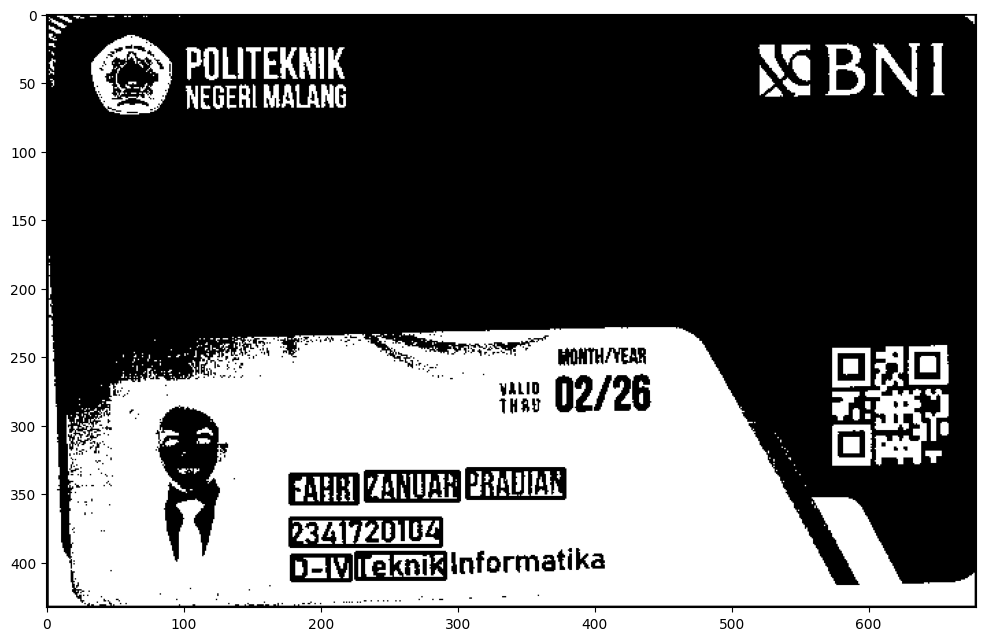

 

eet SSBNI

re MATH NEAR
vas 02/26

cena

D-ekaginformatita

 



In [31]:
# 4. Menambahkan kotak untuk deteksi teksi pada gambar
n_boxes = len(d['text'])
for i in range(n_boxes):
  if int(d['conf'][i]) > 60:
    (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
    mask = cv.rectangle(mask, (x, y), (x + w, y + h), (0, 255, 0), 2)
display(mask)

text1 = pytesseract.image_to_data(mask,output_type='data.frame')
text2 = pytesseract.image_to_string(mask)
print(text2)

text = text1[text1.conf != -1]
lines = text.groupby('block_num')['text'].apply(list)
conf = text.groupby(['block_num'])['conf'].mean()

FAHRI
ZANUAR
PRADIAN
2341720164
D-IV
Teknik



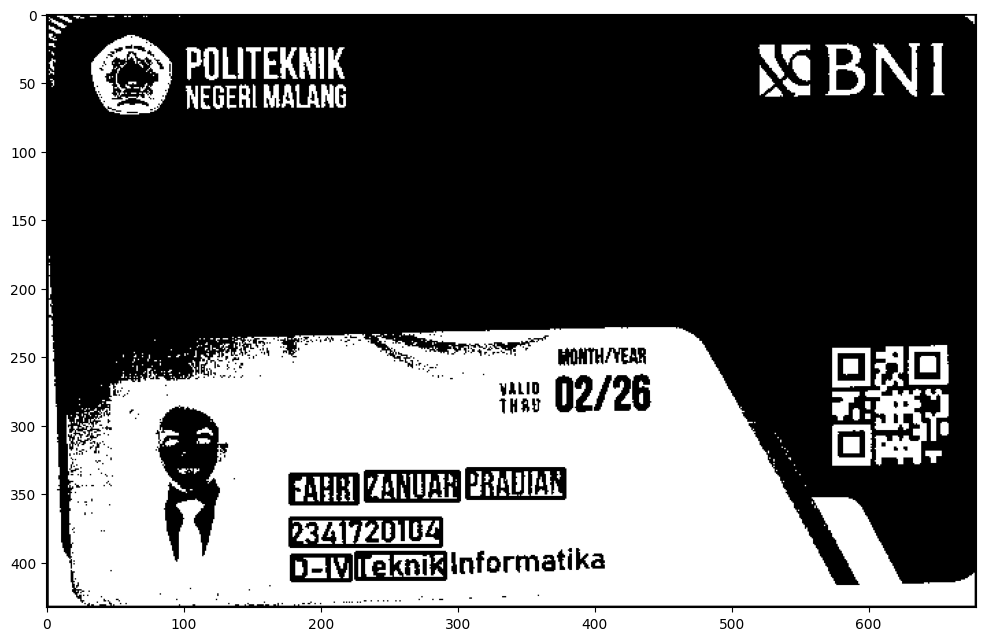

In [32]:
#5. Hasil pembacaan KTP Menjadi text
n_boxes = len(d['text'])
for i in range(n_boxes):
    # Konversi confidence ke integer untuk perbandingan
    if int(d['conf'][i]) > 60:
        # Ambil koordinat
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])

        # Gambar kotak pada gambar 'mask'
        mask = cv.rectangle(mask, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # --- PERBAIKAN DI SINI ---
        # Cetak teks yang Anda temukan, langsung dari variabel 'd'
        print(d['text'][i])

# Tampilkan gambar 'mask' yang sudah ada kotaknya
display(mask)

# --- HAPUS BAGIAN YANG SALAH INI ---
# text1 = pytesseract.image_to_data(mask, output_type='data.frame')
# text2 = pytesseract.image_to_string(mask)
# print(text2) # Ini sumber masalah Anda

### **7. Tugas Kelompok**


##### A. Preprocessing Image

In [33]:
import numpy as np
from google.colab.patches import cv2_imshow
import cv2 as cv
import matplotlib.pyplot as plt
import math
from PIL import Image as im
!pip install pillow_heif
!pip install pillow_heif matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 50.7 MB/s eta 0:00:00


Wajah tersimpan: /content/cropped_faces/face1_b_face.jpg
Wajah tersimpan: /content/cropped_faces/face1_f_face.jpg
Wajah tersimpan: /content/cropped_faces/face1_h_face.jpg

=== FACEA ===


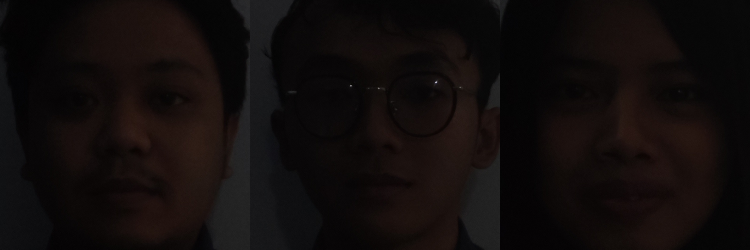

Wajah tersimpan: /content/cropped_faces/face2_b_face.jpg
Wajah tersimpan: /content/cropped_faces/face2_f_face.jpg
Wajah tersimpan: /content/cropped_faces/face2_h_face.jpg

=== FACEB ===


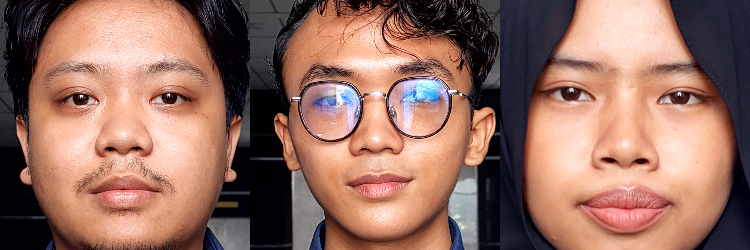

Wajah tersimpan: /content/cropped_faces/face3_b_face.jpg
Wajah tersimpan: /content/cropped_faces/face3_f_face.jpg
Wajah tersimpan: /content/cropped_faces/face3_h_face.jpg

=== FACEC ===


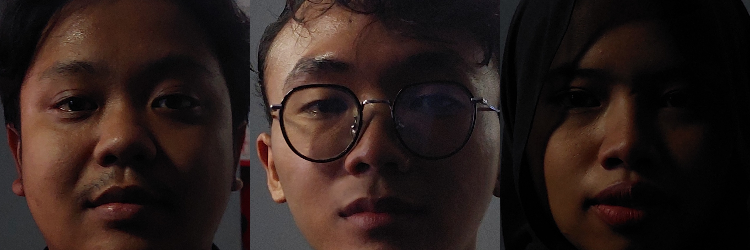

In [34]:
#Hanifah
import cv2 as cv
import numpy as np
import os
from PIL import Image
import pillow_heif
from google.colab.patches import cv2_imshow

output_dir = "/content/cropped_faces"
os.makedirs(output_dir, exist_ok=True)

cascade = cv.CascadeClassifier(cv.data.haarcascades + "haarcascade_frontalface_default.xml")

def load_image(path):
    ext = os.path.splitext(path)[-1].lower()
    if ext == ".heic":
        heif_file = pillow_heif.read_heif(path)
        image = Image.frombytes(
            heif_file.mode,
            heif_file.size,
            heif_file.data
        )
        return cv.cvtColor(np.array(image), cv.COLOR_RGB2BGR)
    else:
        return cv.imread(path)

def auto_enhance(image):
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced_gray = clahe.apply(gray)
    return cv.cvtColor(enhanced_gray, cv.COLOR_GRAY2BGR)

groups = {
    "facea": [
        "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok/face1_b.jpg",
        "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok/face1_f.jpg",
        "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok/face1_h.jpg"
    ],
    "faceb": [
        "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok/face2_b.heic",
        "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok/face2_f.heic",
        "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok/face2_h.heic"
    ],
    "facec": [
        "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok/face3_b.jpg",
        "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok/face3_f.jpg",
        "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok/face3_h.jpg"
    ]
}

for group, paths in groups.items():
    cropped_faces = []

    for p in paths:
        img = load_image(p)
        if img is None:
            print(f"Gambar tidak ditemukan atau format tidak didukung: {p}")
            continue

        enhanced = auto_enhance(img)

        gray = cv.cvtColor(enhanced, cv.COLOR_BGR2GRAY)
        faces = cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(80, 80))

        if len(faces) == 0:
            print(f"Tidak ada wajah terdeteksi pada {p}")
            continue

        (x, y, w, h) = max(faces, key=lambda f: f[2] * f[3])
        cropped = img[y:y+h, x:x+w]

        filename = os.path.join(output_dir, f"{os.path.splitext(os.path.basename(p))[0]}_face.jpg")
        cv.imwrite(filename, cropped)
        print(f"Wajah tersimpan: {filename}")

        cropped_faces.append(cv.resize(cropped, (250, 250)))

    if cropped_faces:
        row = np.hstack(cropped_faces)
        print(f"\n=== {group.upper()} ===")
        cv2_imshow(row)


 transformasi brightness dan contrast (linear/log brightness).

Melewati file: face2_b_face.jpg (sesuai permintaan)
Wajah disimpan dengan penyesuaian: /content/cropped_faces_adjusted/face1_h_face.jpg


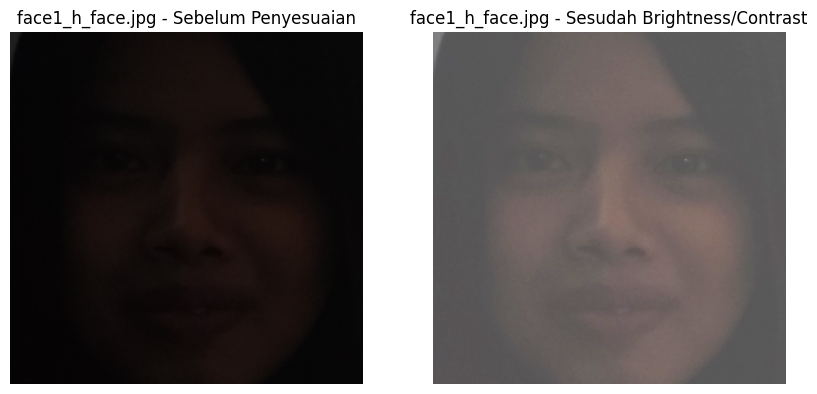

<Figure size 640x480 with 0 Axes>

Wajah disimpan dengan penyesuaian: /content/cropped_faces_adjusted/face1_f_face.jpg


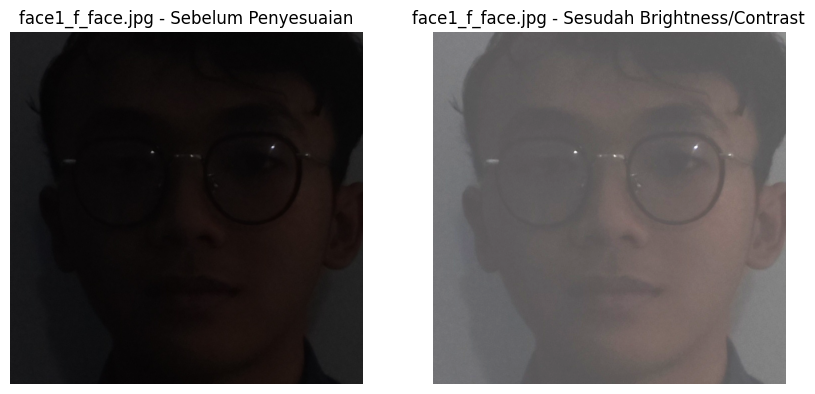

<Figure size 640x480 with 0 Axes>

Wajah disimpan dengan penyesuaian: /content/cropped_faces_adjusted/face3_h_face.jpg


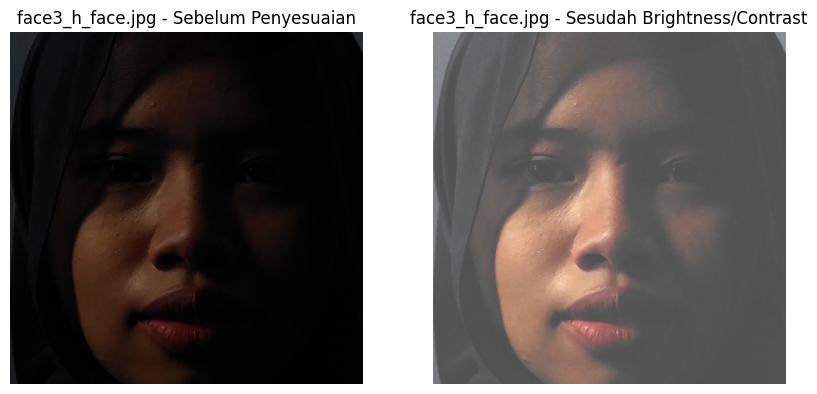

<Figure size 640x480 with 0 Axes>

Wajah disimpan dengan penyesuaian: /content/cropped_faces_adjusted/face1_b_face.jpg


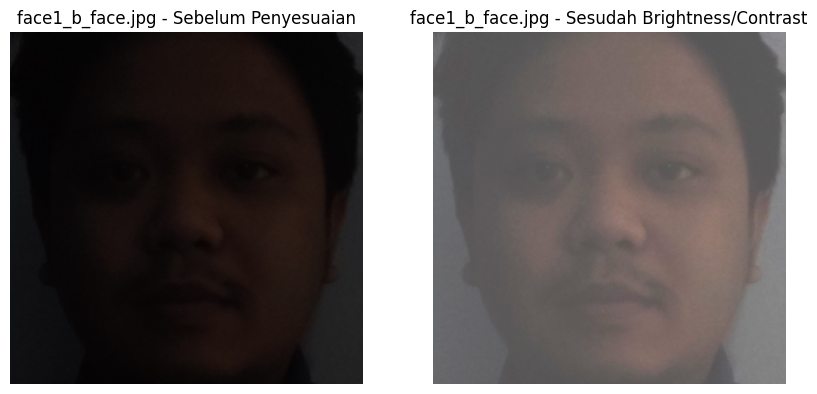

<Figure size 640x480 with 0 Axes>

Wajah disimpan dengan penyesuaian: /content/cropped_faces_adjusted/face3_b_face.jpg


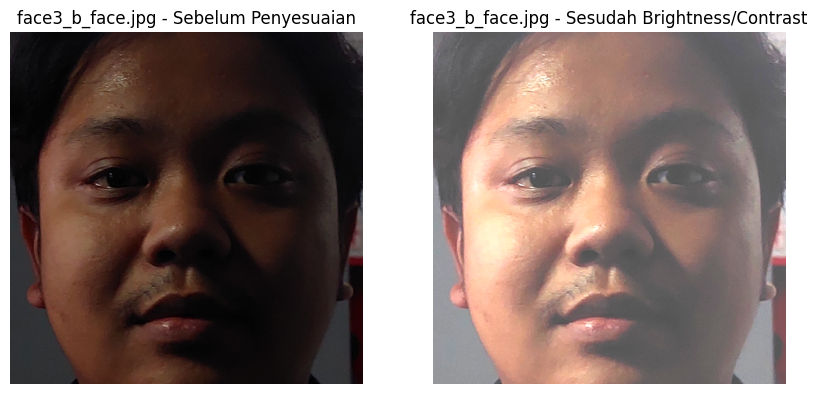

<Figure size 640x480 with 0 Axes>

Wajah disimpan dengan penyesuaian: /content/cropped_faces_adjusted/face3_f_face.jpg


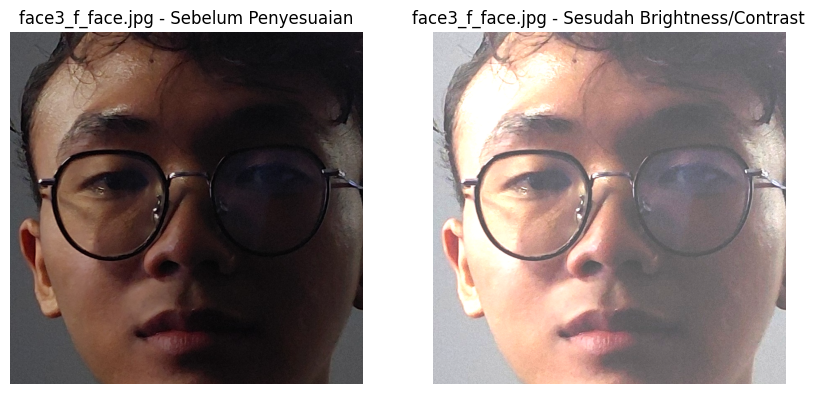

<Figure size 640x480 with 0 Axes>

Melewati file: face2_h_face.jpg (sesuai permintaan)
Melewati file: face2_f_face.jpg (sesuai permintaan)


In [35]:
# Hanifah - Brightness & Contrast Visualization
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

def adjust_brightness_contrast_visualized(input_dir, output_dir, alpha, beta):
    """
    Penyesuaian brightness dan contrast untuk seluruh gambar di folder input.
    Menampilkan hasil sebelum-sesudah dan histogram RGB.
    """
    os.makedirs(output_dir, exist_ok=True)
    image_files = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    for file in image_files:

        # --- MODIFIKASI: Melewati file yang diawali "face_2" ---
        if file.startswith("face2"):
            print(f"Melewati file: {file} (sesuai permintaan)")
            continue

        img_path = os.path.join(input_dir, file)
        img_bgr = cv.imread(img_path)
        if img_bgr is None:
            print(f"File {file} tidak bisa dibaca, dilewati.")
            continue

        # Proses penyesuaian brightness & contrast
        adjusted_bgr = cv.convertScaleAbs(img_bgr, alpha=alpha, beta=beta)

        # Simpan hasilnya
        save_path = os.path.join(output_dir, file)
        cv.imwrite(save_path, adjusted_bgr)
        print(f"Wajah disimpan dengan penyesuaian: {save_path}")

        # Konversi ke RGB untuk visualisasi
        img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
        adjusted_rgb = cv.cvtColor(adjusted_bgr, cv.COLOR_BGR2RGB)

        # --- VISUALISASI GAMBAR ---
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img_rgb)
        plt.title(f'{file} - Sebelum Penyesuaian')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(adjusted_rgb)
        plt.title(f'{file} - Sesudah Brightness/Contrast')
        plt.axis('off')
        plt.show()

        plt.tight_layout()
        plt.show()

# ==== Pemanggilan ====
input_dir = "/content/cropped_faces"
output_dir = "/content/cropped_faces_adjusted"
adjust_brightness_contrast_visualized(input_dir, output_dir, alpha=1.5, beta=80)

histogram equalization untuk memperbaiki sebaran kontras.
• Bandingkan hasil visual dan histogram sebelum–sesudah.

Gambar hasil equalization (YCrCb) disimpan: /content/cropped_faces_equalized_ycrcb/face1_h_face.jpg


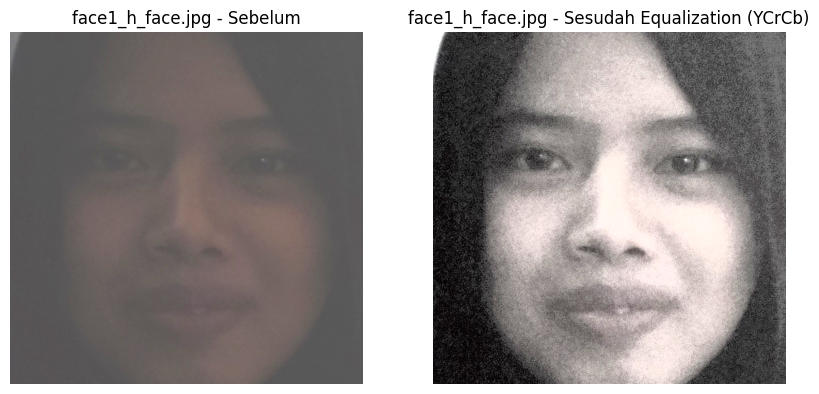

  face1_h_face.jpg | Rata-rata intensitas (Luminance Y):
  Sebelum: 97.44
  Sesudah (YCrCb): 132.35
  Distribusi intensitas lebih merata

Gambar hasil equalization (YCrCb) disimpan: /content/cropped_faces_equalized_ycrcb/face1_f_face.jpg


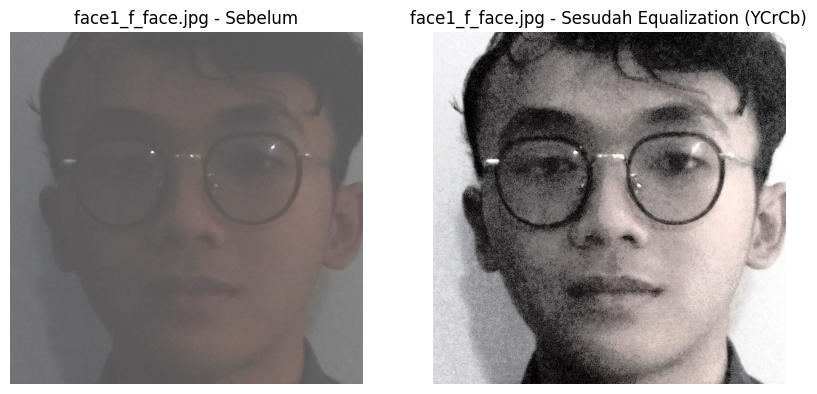

  face1_f_face.jpg | Rata-rata intensitas (Luminance Y):
  Sebelum: 102.54
  Sesudah (YCrCb): 131.72
  Distribusi intensitas lebih merata

Gambar hasil equalization (YCrCb) disimpan: /content/cropped_faces_equalized_ycrcb/face3_h_face.jpg


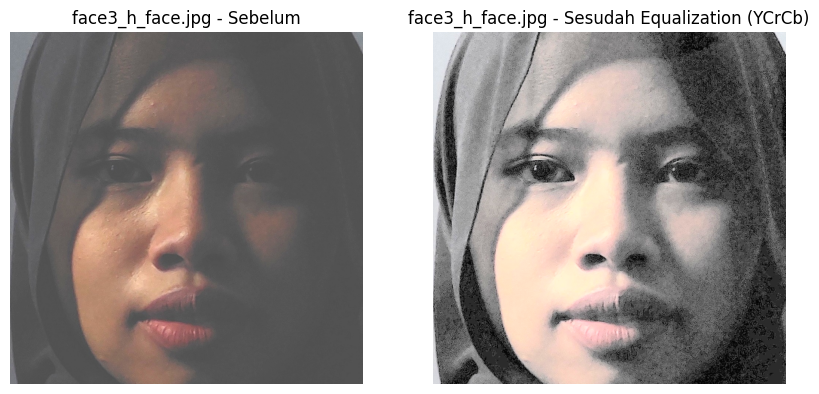

  face3_h_face.jpg | Rata-rata intensitas (Luminance Y):
  Sebelum: 99.96
  Sesudah (YCrCb): 132.93
  Distribusi intensitas lebih merata

Gambar hasil equalization (YCrCb) disimpan: /content/cropped_faces_equalized_ycrcb/face1_b_face.jpg


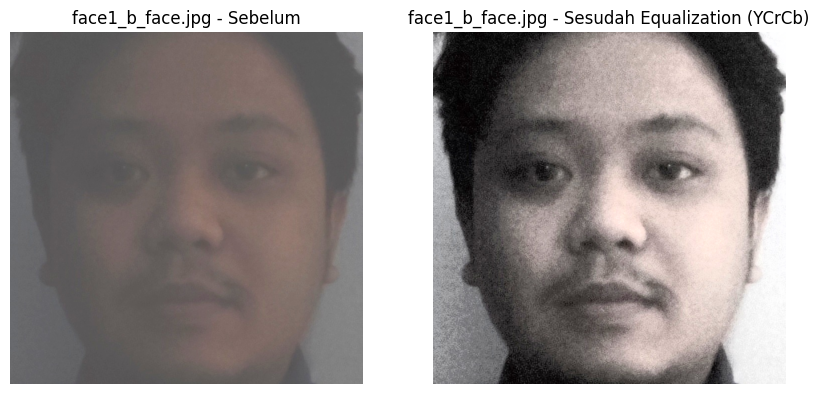

  face1_b_face.jpg | Rata-rata intensitas (Luminance Y):
  Sebelum: 103.53
  Sesudah (YCrCb): 130.79
  Distribusi intensitas lebih merata

Gambar hasil equalization (YCrCb) disimpan: /content/cropped_faces_equalized_ycrcb/face3_b_face.jpg


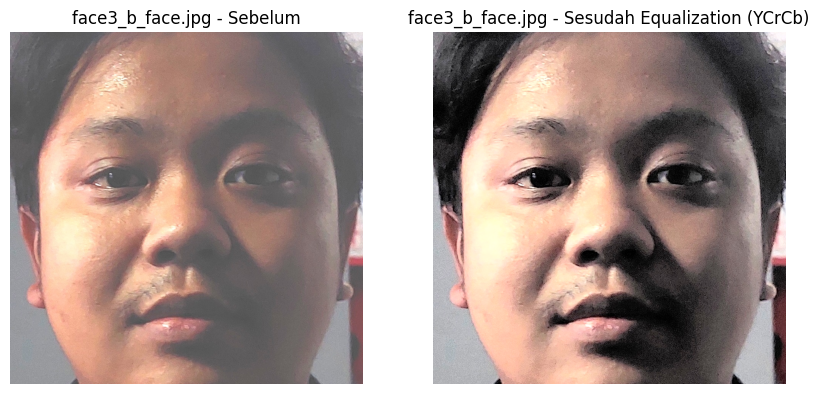

  face3_b_face.jpg | Rata-rata intensitas (Luminance Y):
  Sebelum: 134.72
  Sesudah (YCrCb): 128.81
  Distribusi intensitas lebih merata

Gambar hasil equalization (YCrCb) disimpan: /content/cropped_faces_equalized_ycrcb/face3_f_face.jpg


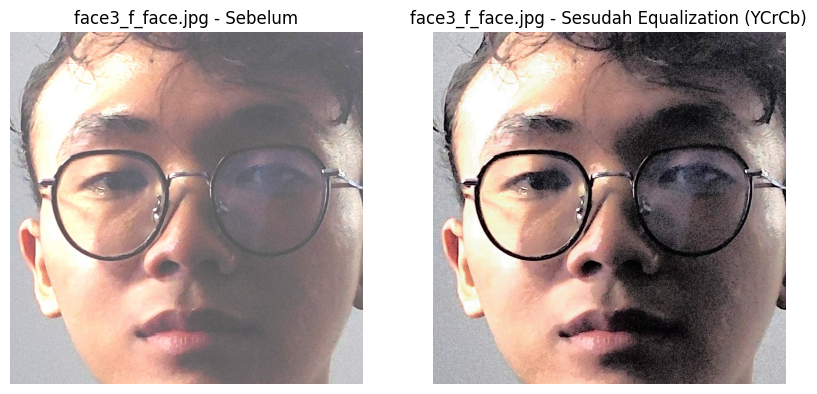

  face3_f_face.jpg | Rata-rata intensitas (Luminance Y):
  Sebelum: 155.45
  Sesudah (YCrCb): 128.65
  Distribusi intensitas lebih merata



In [36]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

def process_histogram_ycrcb_color(input_dir, output_dir):
    os.makedirs(output_dir, exist_ok=True)

    image_files = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    for file in image_files:
       # --- MODIFIKASI: Melewati file yang diawali "face_2" ---
        if file.startswith("face2"):
            print(f"Melewati file: {file} (sesuai permintaan)")
            continue
        # --- Akhir Modifikasi ---
        img_path = os.path.join(input_dir, file)
        img_bgr = cv.imread(img_path)

        if img_bgr is None:
            print(f"File {file} tidak bisa dibaca, dilewati.")
            continue

        # --- EQUALIZATION MENGGUNAKAN YCrCb ---
        # 1. Konversi ke YCrCb
        ycrcb_img = cv.cvtColor(img_bgr, cv.COLOR_BGR2YCrCb)

        # 2. Pisahkan channel Y, Cr, dan Cb
        y, cr, cb = cv.split(ycrcb_img)

        # 3. Lakukan equalization hanya pada channel Y (Luminance)
        y_equalized = cv.equalizeHist(y)

        # 4. Gabungkan kembali channel
        equalized_ycrcb = cv.merge([y_equalized, cr, cb])

        # 5. Konversi kembali ke BGR
        equalized_bgr = cv.cvtColor(equalized_ycrcb, cv.COLOR_YCrCb2BGR)
        # --- SELESAI ---

        # Simpan hasil equalization ke output_dir
        save_path = os.path.join(output_dir, file)
        cv.imwrite(save_path, equalized_bgr)
        print(f"Gambar hasil equalization (YCrCb) disimpan: {save_path}")

        # Konversi BGR ke RGB untuk plotting
        img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
        equalized_rgb = cv.cvtColor(equalized_bgr, cv.COLOR_BGR2RGB)

        # --- Visualisasi Gambar ---
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img_rgb)
        plt.title(f'{file} - Sebelum')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(equalized_rgb)
        plt.title(f'{file} - Sesudah Equalization (YCrCb)')
        plt.axis('off')
        plt.show()

        # --- Analisis Statistik (berdasarkan channel intensitas Y) ---
        mean_before = np.mean(y)
        mean_after = np.mean(y_equalized)
        print(f"  {file} | Rata-rata intensitas (Luminance Y):")
        print(f"  Sebelum: {mean_before:.2f}")
        print(f"  Sesudah (YCrCb): {mean_after:.2f}")
        print(f"  {'Distribusi intensitas lebih merata' if abs(mean_after - 128) < abs(mean_before - 128) else 'Perubahan minimal'}\n")

# ==== Contoh pemanggilan ====
input_dir = "/content/cropped_faces_adjusted"
output_dir = "/content/cropped_faces_equalized_ycrcb"
process_histogram_ycrcb_color(input_dir, output_dir)

Gambar hasil denoising disimpan: /content/cropped_faces_denoised/face1_h_face.jpg


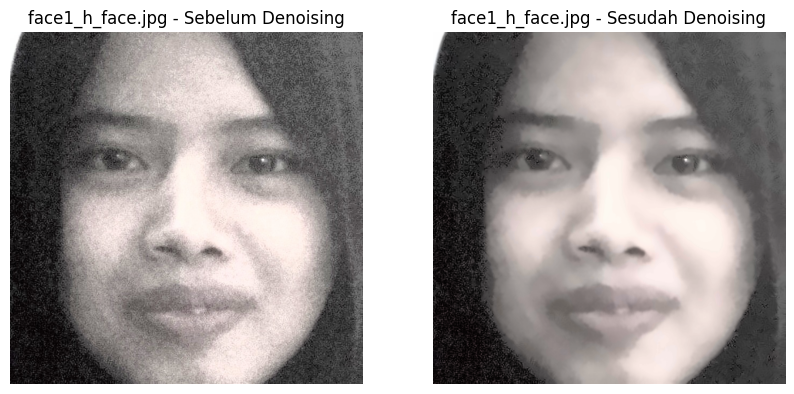

Gambar hasil denoising disimpan: /content/cropped_faces_denoised/face1_f_face.jpg


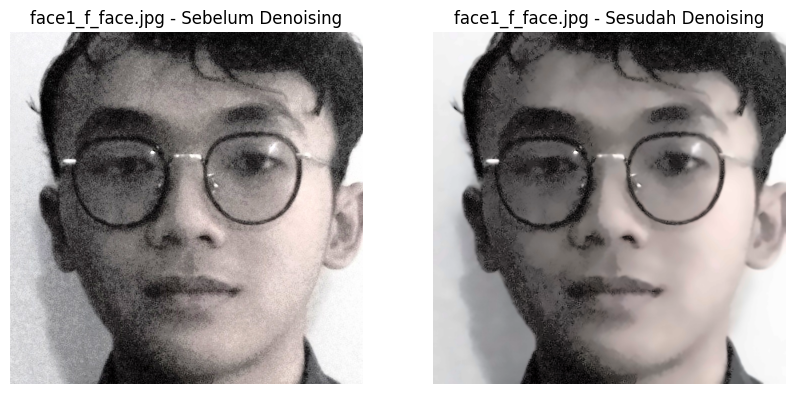

Gambar hasil denoising disimpan: /content/cropped_faces_denoised/face3_h_face.jpg


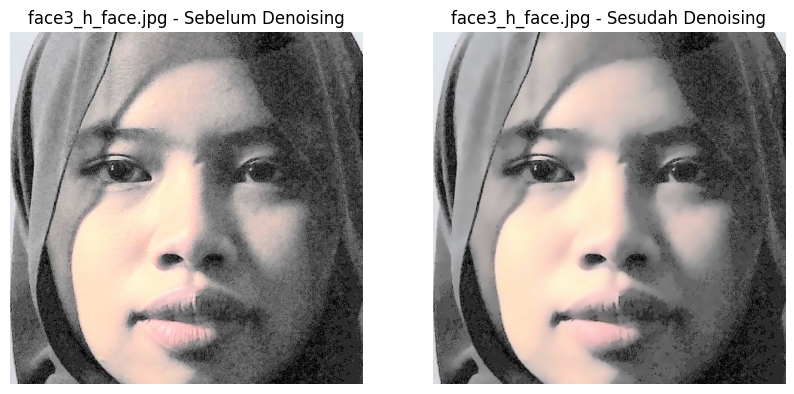

Gambar hasil denoising disimpan: /content/cropped_faces_denoised/face1_b_face.jpg


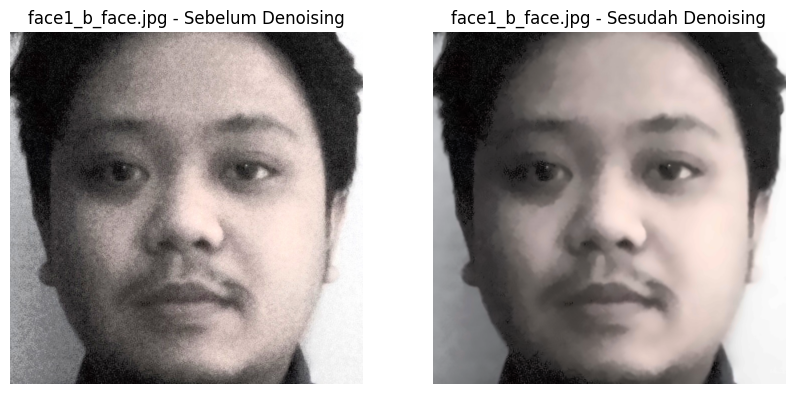

Gambar hasil denoising disimpan: /content/cropped_faces_denoised/face3_b_face.jpg


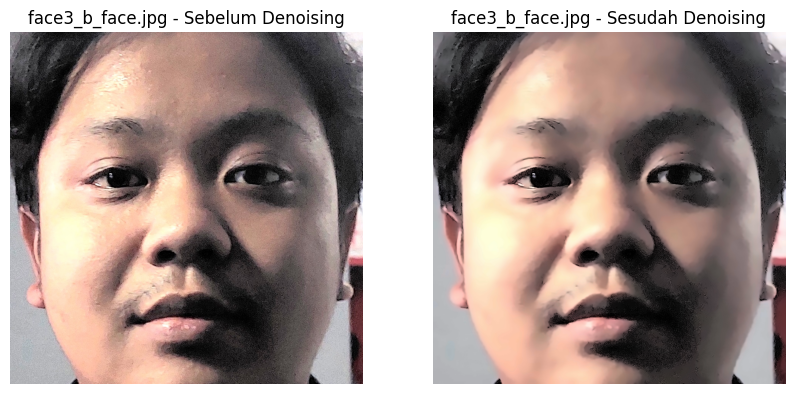

Gambar hasil denoising disimpan: /content/cropped_faces_denoised/face3_f_face.jpg


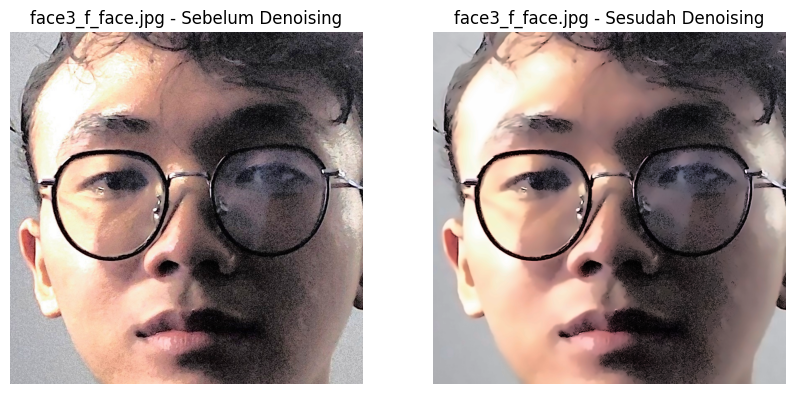

In [37]:
def process_denoising_color(input_dir, output_dir, h=10, h_color=10, template_window=7, search_window=21):

    os.makedirs(output_dir, exist_ok=True)

    image_files = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    for file in image_files:
       # --- MODIFIKASI: Melewati file yang diawali "face_2" ---
        if file.startswith("face2"):
            print(f"Melewati file: {file} (sesuai permintaan)")
            continue
        img_path = os.path.join(input_dir, file)
        img_bgr = cv.imread(img_path)

        if img_bgr is None:
            print(f"File {file} tidak bisa dibaca, dilewati.")
            continue

        # --- PROSES DENOISING MENGGUNAKAN NON-LOCAL MEANS ---
        # Parameter h dan h_color mengontrol seberapa kuat denoising.
        # Nilai yang lebih tinggi akan menghilangkan lebih banyak noise,
        # tetapi juga bisa menghilangkan detail. 10 adalah nilai default yang baik.
        denoised_bgr = cv.fastNlMeansDenoisingColored(img_bgr,
                                                     None,
                                                     h,
                                                     h_color,
                                                     template_window,
                                                     search_window)
        # --- SELESAI ---

        # Simpan hasil denoising ke output_dir
        save_path = os.path.join(output_dir, file)
        cv.imwrite(save_path, denoised_bgr)
        print(f"Gambar hasil denoising disimpan: {save_path}")

        # Konversi BGR ke RGB untuk plotting
        img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
        denoised_rgb = cv.cvtColor(denoised_bgr, cv.COLOR_BGR2RGB)

        # --- Visualisasi Gambar ---
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img_rgb)
        plt.title(f'{file} - Sebelum Denoising')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(denoised_rgb)
        plt.title(f'{file} - Sesudah Denoising')
        plt.axis('off')
        plt.show()

input_dir = "/content/cropped_faces_equalized_ycrcb"
output_dir = "/content/cropped_faces_denoised"

process_denoising_color(input_dir, output_dir)

menggabungkan hasil preprocessing

In [38]:
import os
import shutil

output_dir_final = "/content/hasil_akhir"

os.makedirs(output_dir_final, exist_ok=True)

original_face2_dir = "/content/drive/MyDrive/Colab Notebooks/PCVK/images/foto kelompok" # Assuming original face2 files are here
denoised_faces_dir = "/content/cropped_faces_denoised"

# List of specific files to copy
# Original face2 files (HEIC files converted to BGR and saved as JPG during cropping)
face2_original_files = [
    "face2_b_face.jpg",
    "face2_f_face.jpg",
    "face2_h_face.jpg"
]

# Denoised face1 and face3 files (assuming they were processed and saved with _face.jpg suffix)
denoised_face1_and_face3_files = [
    "face1_b_face.jpg",
    "face1_f_face.jpg",
    "face1_h_face.jpg",
    "face3_b_face.jpg",
    "face3_f_face.jpg",
    "face3_h_face.jpg"
]

print(f"Creating final directory: {output_dir_final}")

# Copy original face2 images (assuming they were saved as JPG in the cropping step)
# We will look for them in the directory where cropped faces were saved,
# as the HEIC conversion and saving happened there.
cropped_faces_dir = "/content/cropped_faces"
print("\nCopying original face2 images...")
for file_name in face2_original_files:
    src_path = os.path.join(cropped_faces_dir, file_name) # Look in cropped_faces for the JPG version
    dest_path = os.path.join(output_dir_final, file_name)
    if os.path.exists(src_path):
        shutil.copy(src_path, dest_path)
        print(f"Copied: {file_name}")
    else:
        print(f"Warning: Original face2 file not found: {src_path}")


# Copy denoised face1 and face3 images
print("\nCopying denoised face1 and face3 images...")
for file_name in denoised_face1_and_face3_files:
    src_path = os.path.join(denoised_faces_dir, file_name)
    dest_path = os.path.join(output_dir_final, file_name)
    if os.path.exists(src_path):
        shutil.copy(src_path, dest_path)
        print(f"Copied: {file_name}")
    else:
        print(f"Warning: Denoised file not found: {src_path}")

print("\nFinished copying files to", output_dir_final)

# Optional: List files in the final directory to verify
print("\nFiles in final directory:")
for f in os.listdir(output_dir_final):
    print(f)

Creating final directory: /content/hasil_akhir

Copying original face2 images...
Copied: face2_b_face.jpg
Copied: face2_f_face.jpg
Copied: face2_h_face.jpg

Copying denoised face1 and face3 images...
Copied: face1_b_face.jpg
Copied: face1_f_face.jpg
Copied: face1_h_face.jpg
Copied: face3_b_face.jpg
Copied: face3_f_face.jpg
Copied: face3_h_face.jpg

Finished copying files to /content/hasil_akhir

Files in final directory:
face2_b_face.jpg
face1_h_face.jpg
face1_f_face.jpg
face3_h_face.jpg
face1_b_face.jpg
face3_b_face.jpg
face3_f_face.jpg
face2_h_face.jpg
face2_f_face.jpg


#### B. Segmentasi Citra Wajah

Berdasarkan materi yang diberikan, kita akan menerapkan beberapa metode segmentasi berbasis *thresholding* untuk memisahkan objek wajah dari *background*.

Metode yang akan diimplementasikan mencakup:
1. Global Thresholding (Otsu's Method)
2. Adaptive Thresholding

=== Menerapkan Global Thresholding (Otsu's) ===
Hasil global thresholding disimpan: /content/segmented_faces_global/face2_b_face_global_segmented.png


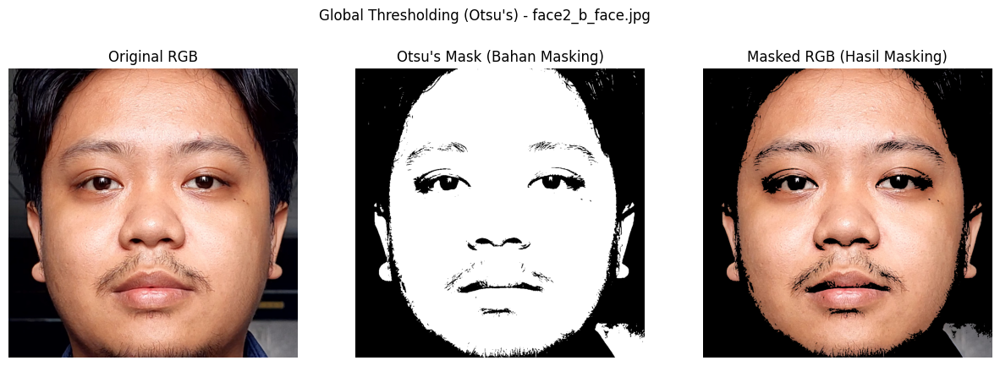

Hasil global thresholding disimpan: /content/segmented_faces_global/face1_h_face_global_segmented.png


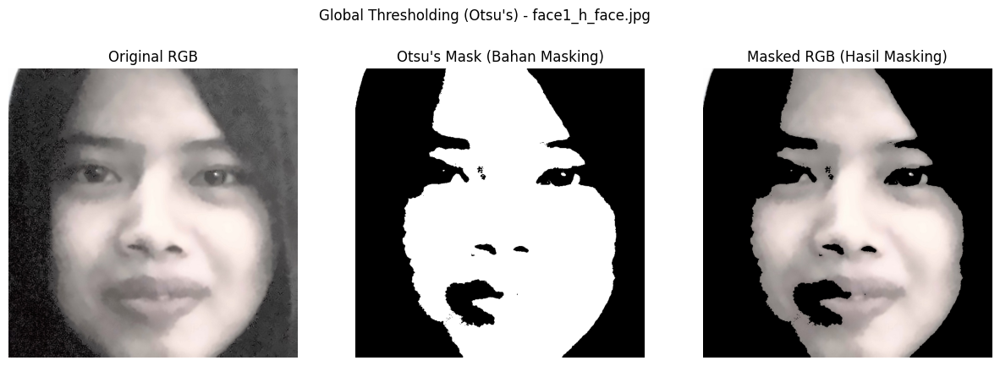

Hasil global thresholding disimpan: /content/segmented_faces_global/face1_f_face_global_segmented.png


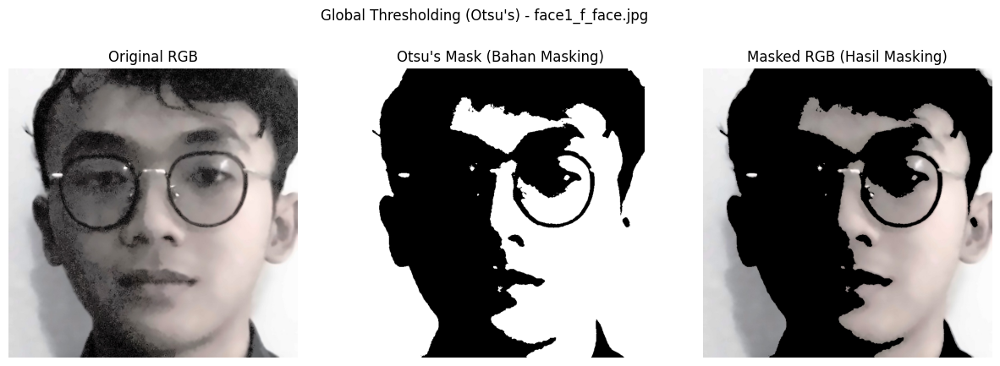

Hasil global thresholding disimpan: /content/segmented_faces_global/face3_h_face_global_segmented.png


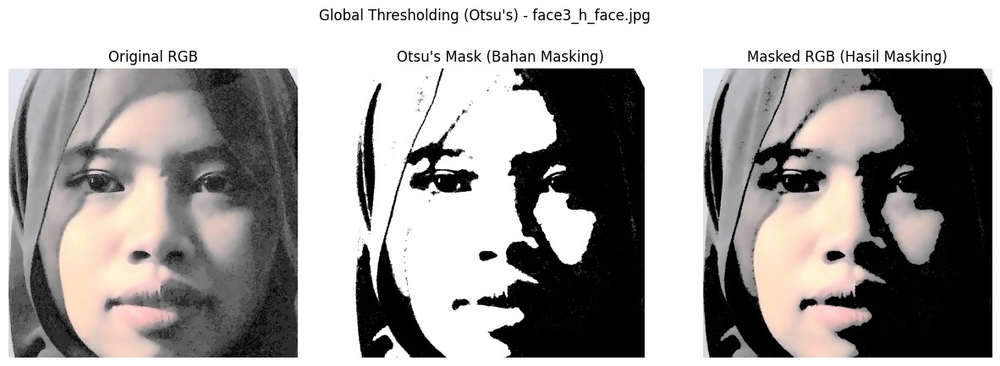

Hasil global thresholding disimpan: /content/segmented_faces_global/face1_b_face_global_segmented.png


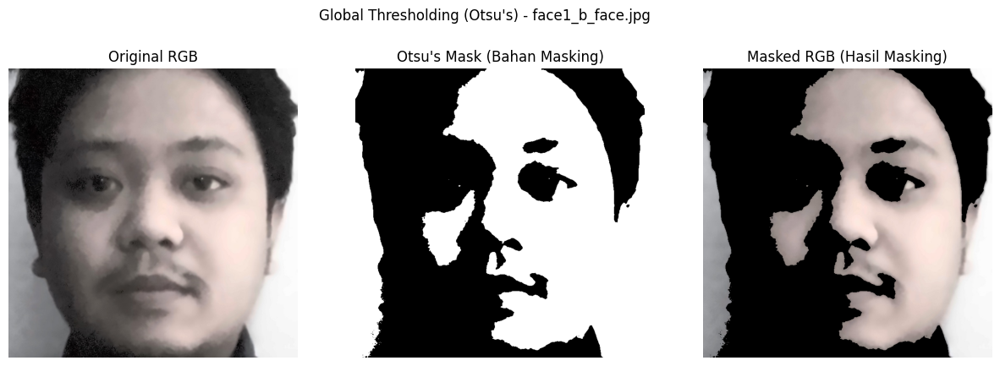

Hasil global thresholding disimpan: /content/segmented_faces_global/face3_b_face_global_segmented.png


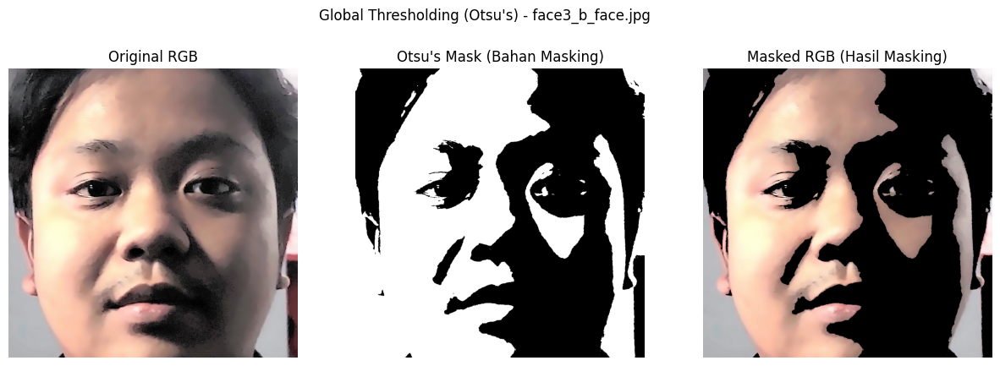

Hasil global thresholding disimpan: /content/segmented_faces_global/face3_f_face_global_segmented.png


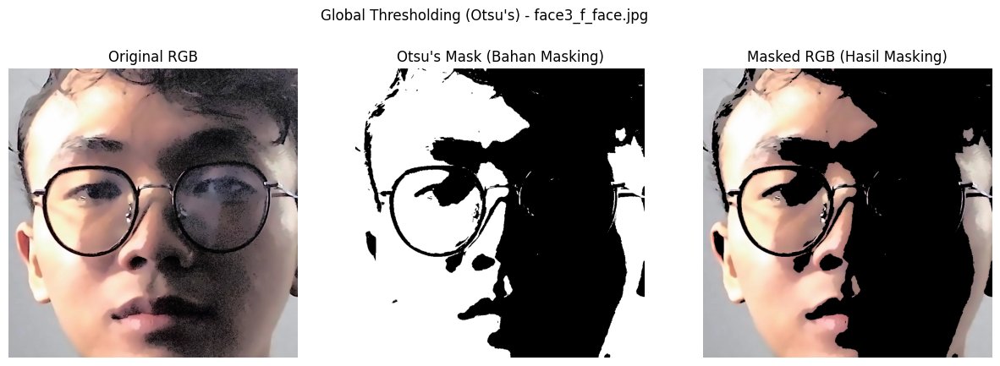

Hasil global thresholding disimpan: /content/segmented_faces_global/face2_h_face_global_segmented.png


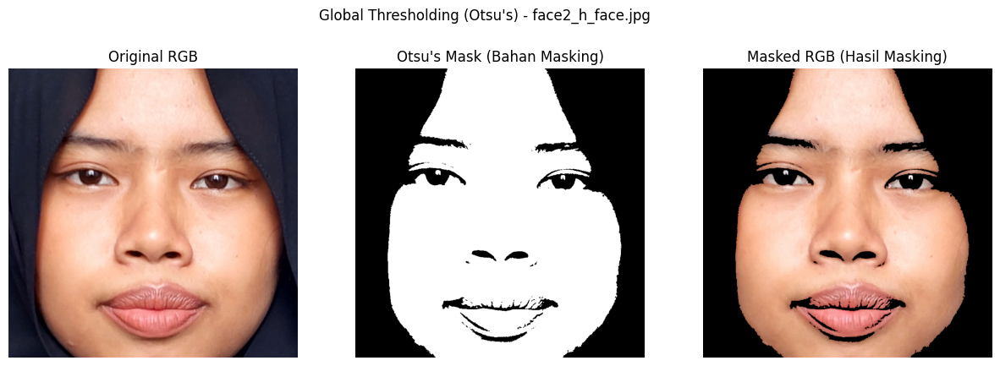

Hasil global thresholding disimpan: /content/segmented_faces_global/face2_f_face_global_segmented.png


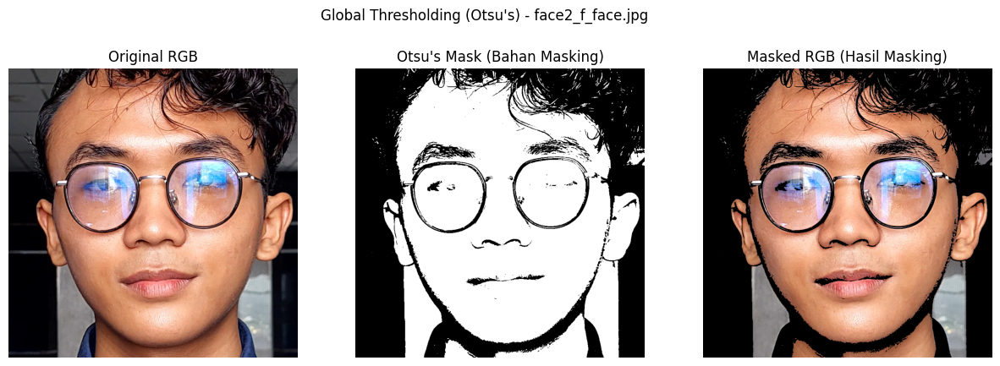

In [43]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

input_dir = "/content/hasil_akhir" # Menggunakan hasil spatial filtering
output_dir_global_threshold = "/content/segmented_faces_global"

os.makedirs(output_dir_global_threshold, exist_ok=True)

print("=== Menerapkan Global Thresholding (Otsu's) ===")

image_files = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

for file in image_files:
    path = os.path.join(input_dir, file)
    img_bgr = cv.imread(path) # <- img_bgr (Original RGB) sudah ada di sini

    if img_bgr is None:
        print(f"⚠️ File {file} tidak bisa dibaca, dilewati.")
        continue

    # Konversi ke grayscale
    gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)

    # Terapkan Global Thresholding (Otsu's Method)
    # thresh (Mask-nya) akan kita pakai di Plot 2
    ret, thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

    # Simpan hasil segmentasi (mask-nya)
    output_path = os.path.join(output_dir_global_threshold, f"{os.path.splitext(file)[0]}_global_segmented.png")
    cv.imwrite(output_path, thresh)
    print(f"Hasil global thresholding disimpan: {output_path}")

    # === BUAT GAMBAR YANG DI-MASKING ===

    # 1. Buat Wajah Berwarna (RGB) dengan Background Hitam
    # masked_rgb akan kita pakai di Plot 3
    masked_rgb = cv.bitwise_and(img_bgr, img_bgr, mask=thresh)

    # 2. Buat Wajah Grayscale (tidak kita pakai di plot, tapi tidak apa-apa)
    masked_gray = cv.bitwise_and(gray, gray, mask=thresh)


    # === Visualisasi (REVISI SESUAI PERMINTAAN ANDA) ===
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Global Thresholding (Otsu's) - {file}", fontsize=12)

    # Plot 1: Original RGB (Sesuai permintaan)
    plt.subplot(1, 3, 1)
    plt.imshow(cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)) # Tampilkan img_bgr
    plt.title("Original RGB")
    plt.axis('off')

    # Plot 2: Otsu's Mask (Sesuai permintaan)
    plt.subplot(1, 3, 2)
    plt.imshow(thresh, cmap='gray') # Tampilkan mask 'thresh'
    plt.title(f"Otsu's Mask (Bahan Masking)")
    plt.axis('off')

    # Plot 3: Wajah Berwarna yang di-mask (Sesuai permintaan)
    plt.subplot(1, 3, 3)
    plt.imshow(cv.cvtColor(masked_rgb, cv.COLOR_BGR2RGB)) # Tampilkan 'masked_rgb'
    plt.title(f"Masked RGB (Hasil Masking)")
    plt.axis('off')

    plt.show()

=== Menerapkan Segmentasi dengan GrabCut ===
Hasil GrabCut disimpan: /content/segmented_faces_grabcut/face2_b_face_grabcut_masked.png


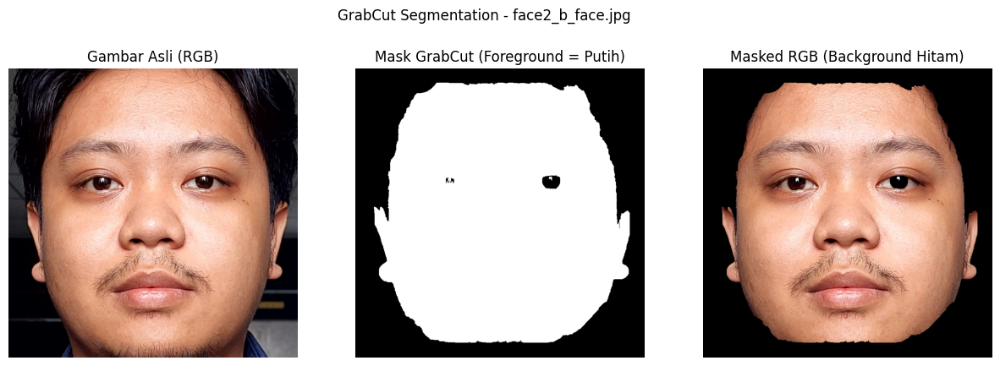

Hasil GrabCut disimpan: /content/segmented_faces_grabcut/face1_h_face_grabcut_masked.png


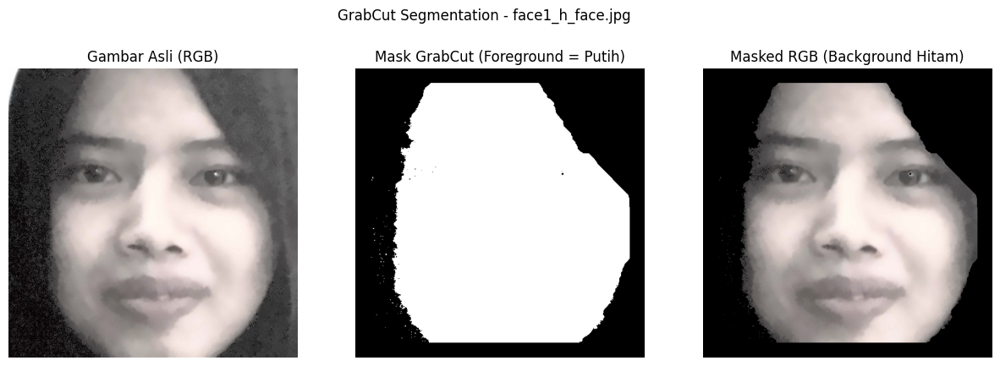

Hasil GrabCut disimpan: /content/segmented_faces_grabcut/face1_f_face_grabcut_masked.png


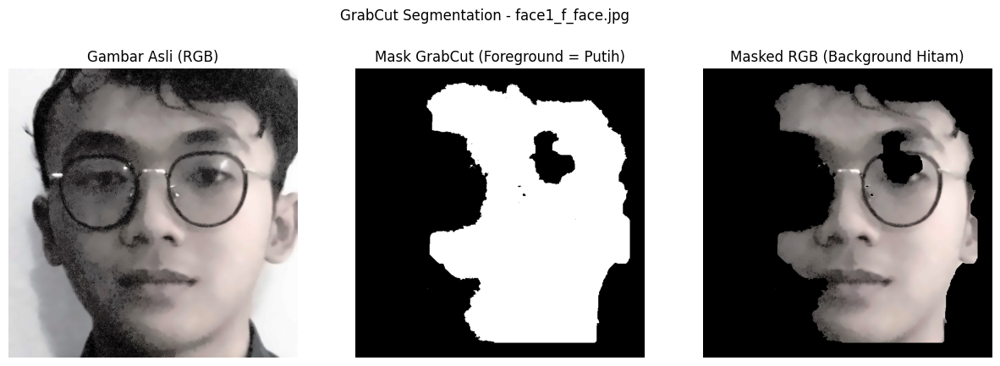

Hasil GrabCut disimpan: /content/segmented_faces_grabcut/face3_h_face_grabcut_masked.png


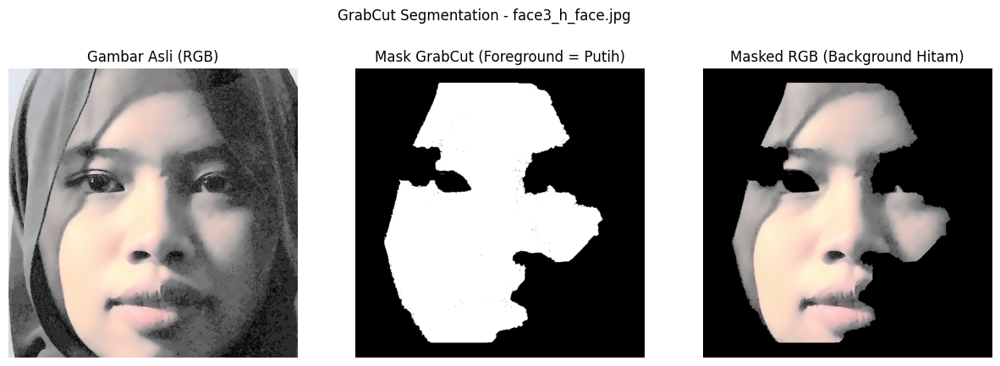

Hasil GrabCut disimpan: /content/segmented_faces_grabcut/face1_b_face_grabcut_masked.png


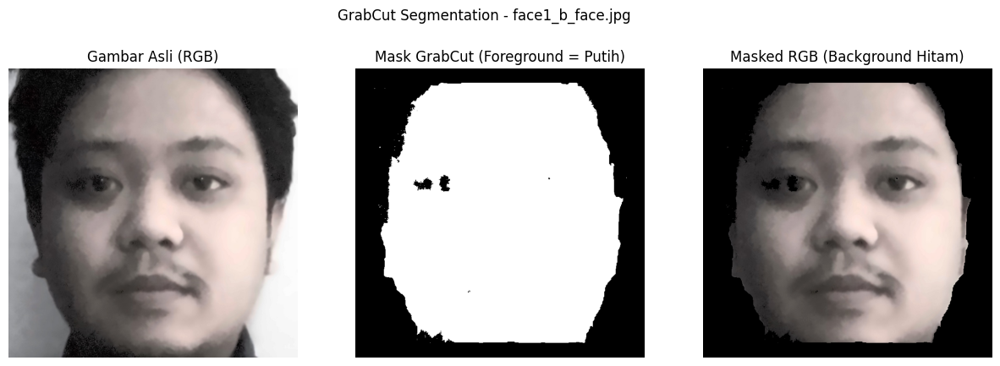

Hasil GrabCut disimpan: /content/segmented_faces_grabcut/face3_b_face_grabcut_masked.png


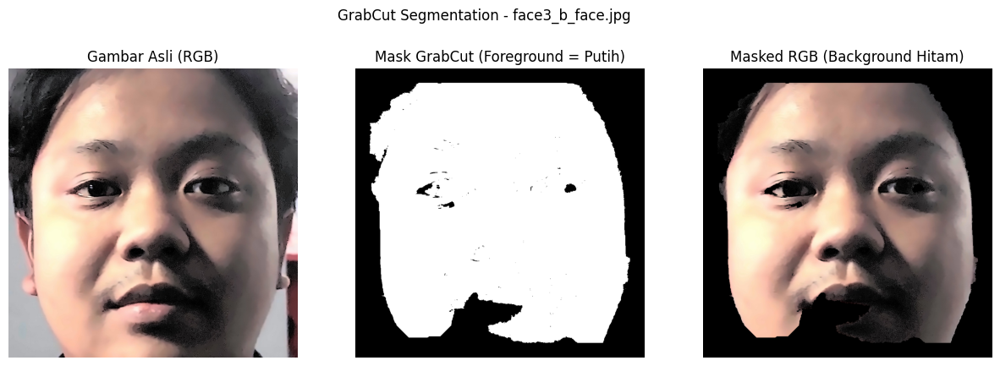

Hasil GrabCut disimpan: /content/segmented_faces_grabcut/face3_f_face_grabcut_masked.png


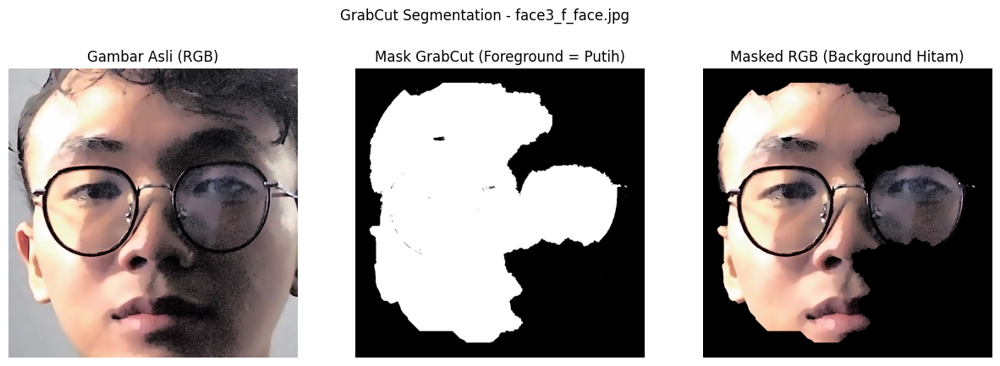

Hasil GrabCut disimpan: /content/segmented_faces_grabcut/face2_h_face_grabcut_masked.png


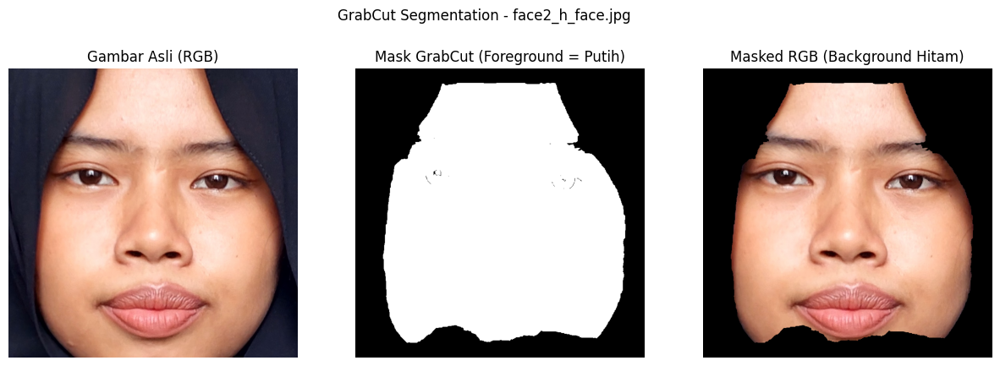

Hasil GrabCut disimpan: /content/segmented_faces_grabcut/face2_f_face_grabcut_masked.png


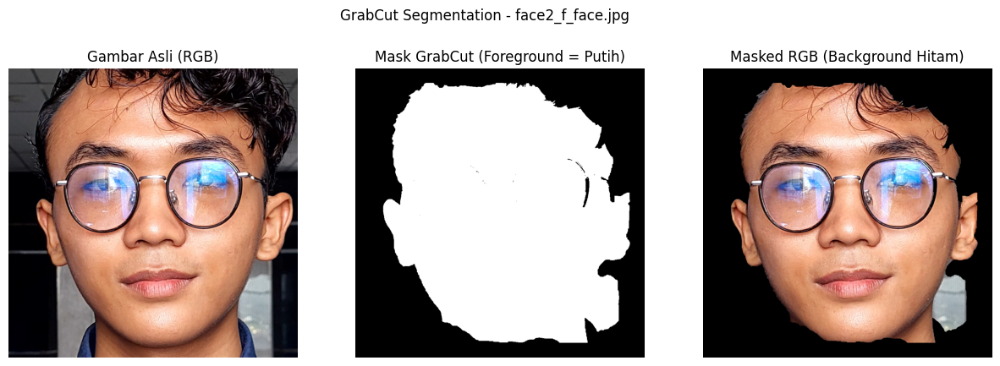

In [49]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

input_dir = "/content/hasil_akhir"
output_dir_grabcut = "/content/segmented_faces_grabcut"
os.makedirs(output_dir_grabcut, exist_ok=True)

print("=== Menerapkan Segmentasi dengan GrabCut ===")

image_files = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

for file in image_files:
    path = os.path.join(input_dir, file)
    img_bgr = cv.imread(path)

    if img_bgr is None:
        print(f"⚠️ File {file} tidak bisa dibaca, dilewati.")
        continue

    # --- Inisialisasi mask dan background/foreground model ---
    mask = np.zeros(img_bgr.shape[:2], np.uint8)
    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)

    # --- Buat rectangle sekitar wajah (area awal untuk GrabCut) ---
    h, w = img_bgr.shape[:2]
    rect = (int(w*0.05), int(h*0.05), int(w*0.9), int(h*0.9))  # ambil hampir seluruh gambar

    # --- Terapkan GrabCut ---
    cv.grabCut(img_bgr, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)

    # Mask final: 0 dan 2 = background, 1 dan 3 = foreground
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    masked_bgr = img_bgr * mask2[:, :, np.newaxis]

    # Simpan hasil masked RGB
    output_path = os.path.join(output_dir_grabcut, f"{os.path.splitext(file)[0]}_grabcut_masked.png")
    cv.imwrite(output_path, masked_bgr)
    print(f"Hasil GrabCut disimpan: {output_path}")

    # === Visualisasi ===
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"GrabCut Segmentation - {file}", fontsize=12)

    plt.subplot(1, 3, 1)
    plt.imshow(cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB))
    plt.title("Gambar Asli (RGB)")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask2, cmap='gray')
    plt.title("Mask GrabCut (Foreground = Putih)")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv.cvtColor(masked_bgr, cv.COLOR_BGR2RGB))
    plt.title("Masked RGB (Background Hitam)")
    plt.axis('off')

    plt.show()



=== Menerapkan K-Means Clustering ===
Hasil mask disimpan: /content/segmented_faces_kmeans/face2_b_face_kmeans_mask.png
Hasil wajah berwarna disimpan: /content/segmented_faces_kmeans/face2_b_face_kmeans_masked.png


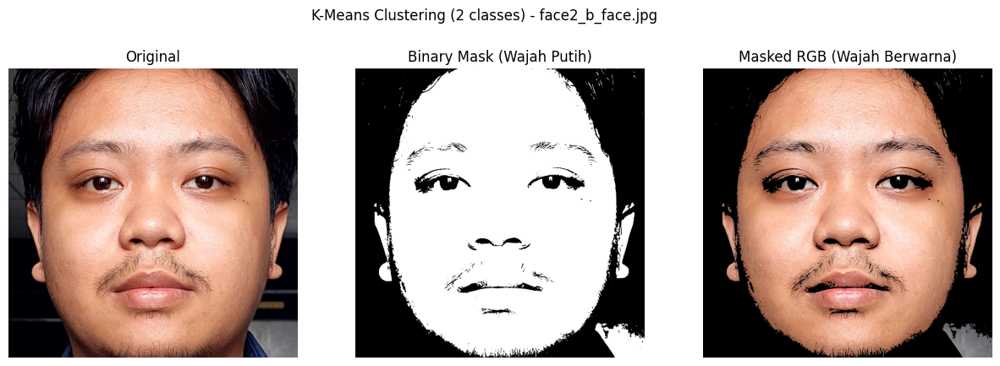

Hasil mask disimpan: /content/segmented_faces_kmeans/face1_h_face_kmeans_mask.png
Hasil wajah berwarna disimpan: /content/segmented_faces_kmeans/face1_h_face_kmeans_masked.png


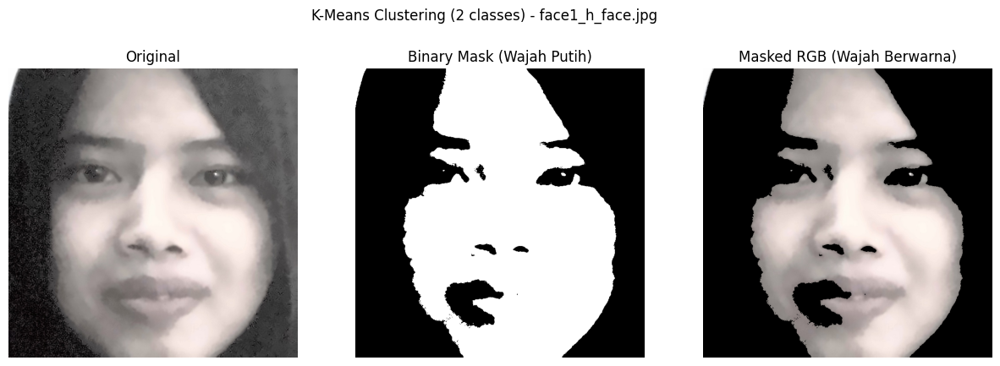

Hasil mask disimpan: /content/segmented_faces_kmeans/face1_f_face_kmeans_mask.png
Hasil wajah berwarna disimpan: /content/segmented_faces_kmeans/face1_f_face_kmeans_masked.png


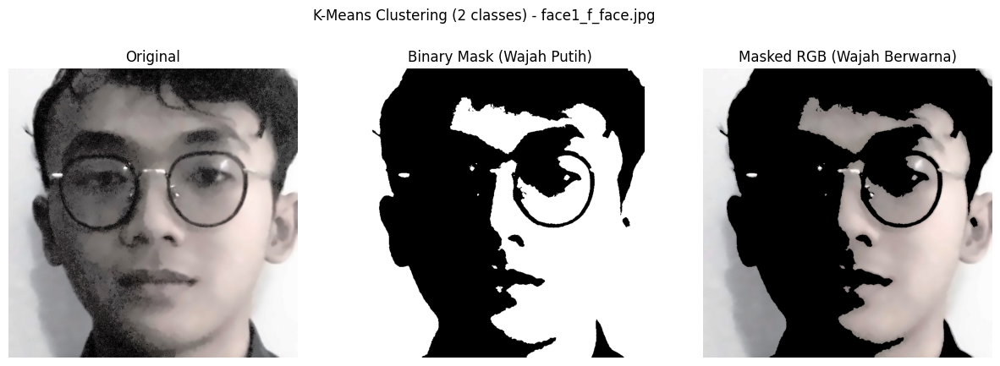

Hasil mask disimpan: /content/segmented_faces_kmeans/face3_h_face_kmeans_mask.png
Hasil wajah berwarna disimpan: /content/segmented_faces_kmeans/face3_h_face_kmeans_masked.png


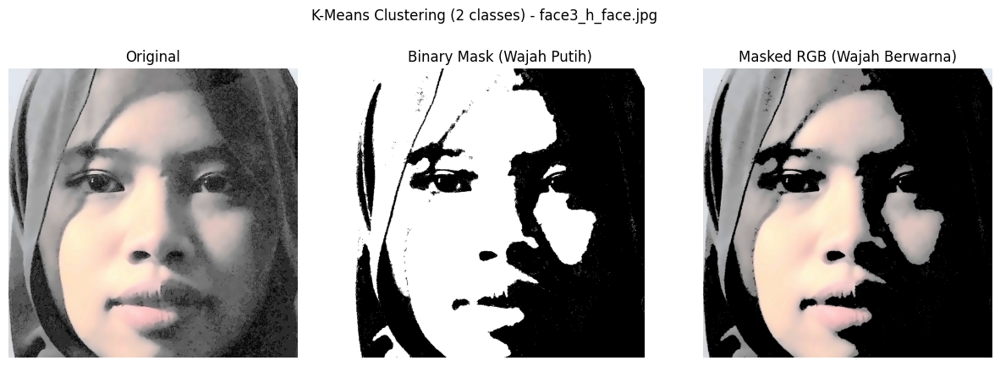

Hasil mask disimpan: /content/segmented_faces_kmeans/face1_b_face_kmeans_mask.png
Hasil wajah berwarna disimpan: /content/segmented_faces_kmeans/face1_b_face_kmeans_masked.png


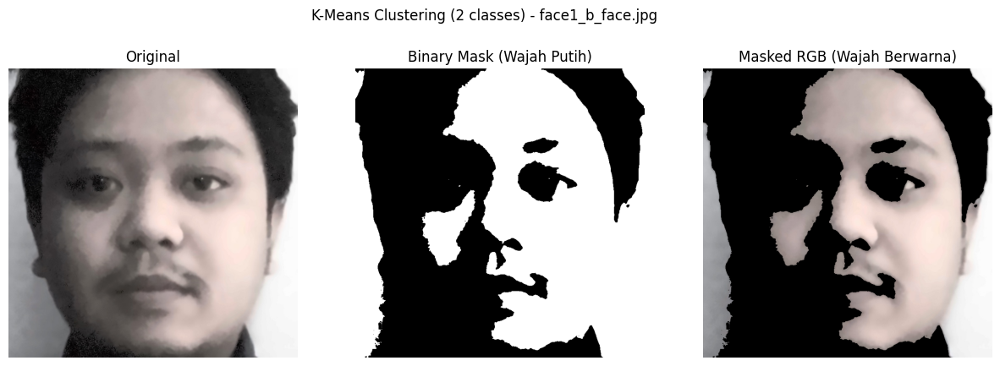

Hasil mask disimpan: /content/segmented_faces_kmeans/face3_b_face_kmeans_mask.png
Hasil wajah berwarna disimpan: /content/segmented_faces_kmeans/face3_b_face_kmeans_masked.png


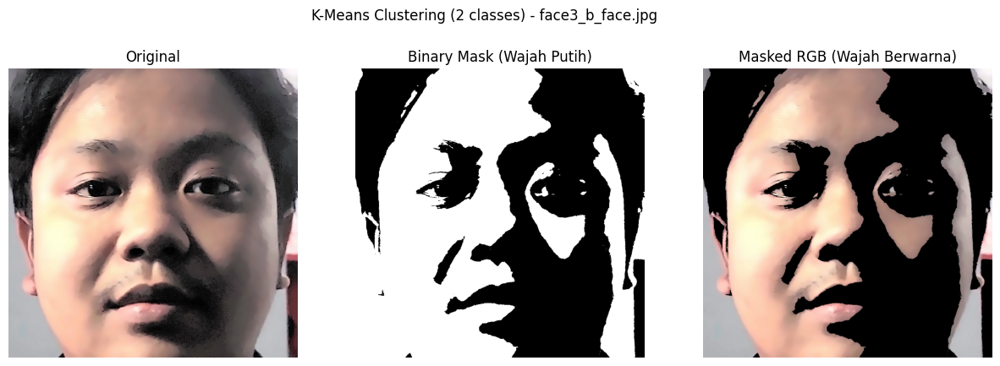

Hasil mask disimpan: /content/segmented_faces_kmeans/face3_f_face_kmeans_mask.png
Hasil wajah berwarna disimpan: /content/segmented_faces_kmeans/face3_f_face_kmeans_masked.png


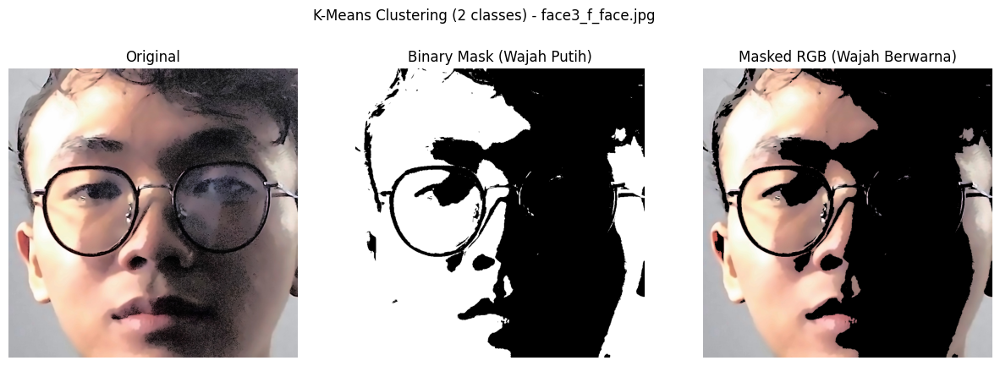

Hasil mask disimpan: /content/segmented_faces_kmeans/face2_h_face_kmeans_mask.png
Hasil wajah berwarna disimpan: /content/segmented_faces_kmeans/face2_h_face_kmeans_masked.png


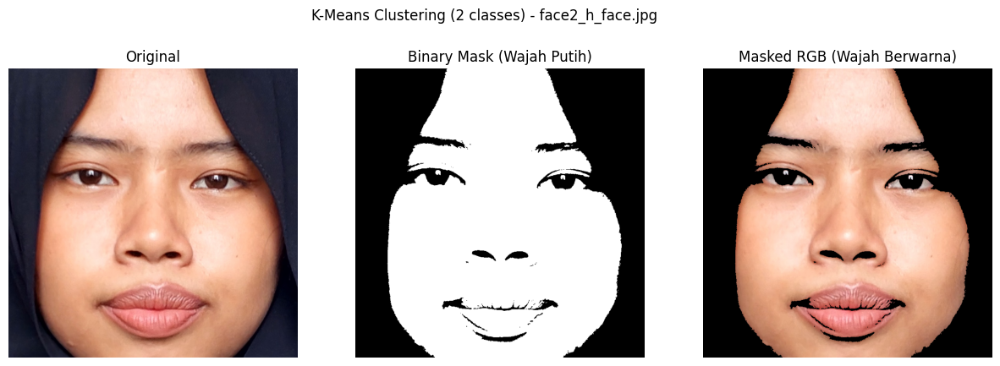

Hasil mask disimpan: /content/segmented_faces_kmeans/face2_f_face_kmeans_mask.png
Hasil wajah berwarna disimpan: /content/segmented_faces_kmeans/face2_f_face_kmeans_masked.png


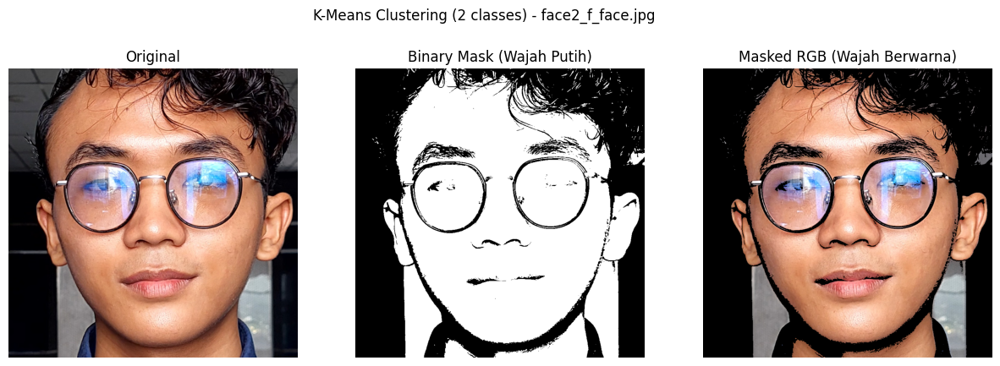

In [51]:
# === Segmentasi dengan K-Means Clustering ===
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans

input_dir = "/content/hasil_akhir" # Using spatial filtered results
output_dir_kmeans = "/content/segmented_faces_kmeans"

os.makedirs(output_dir_kmeans, exist_ok=True)

print("\n=== Menerapkan K-Means Clustering ===")

# Parameter for K-Means
k_clusters = 2 # Number of clusters (can be adjusted, 2 for binary segmentation)

image_files = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

for file in image_files:
    path = os.path.join(input_dir, file)
    img_bgr = cv.imread(path)

    if img_bgr is None:
        print(f"⚠️ File {file} tidak bisa dibaca, dilewati.")
        continue

    # Konversi ke RGB dan normalisasi
    img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
    img_float = np.float32(img_rgb) / 255.0
    height, width, _ = img_rgb.shape

    # Ubah jadi daftar piksel
    pixels = img_float.reshape((-1, 3))

    try:
        # Terapkan K-Means
        kmeans = KMeans(n_clusters=k_clusters, random_state=42, n_init=10)
        kmeans.fit(pixels)

        centers = np.uint8(kmeans.cluster_centers_ * 255.0)
        labels = kmeans.labels_

        # Bentuk ulang hasil segmentasi
        segmented_img_flat = centers[labels]
        segmented_img_rgb = segmented_img_flat.reshape(img_rgb.shape)

        # Deteksi cluster yang paling mungkin mewakili wajah
        centers_bgr = cv.cvtColor(centers.reshape(1, -1, 3), cv.COLOR_RGB2BGR).reshape(-1, 3)
        centers_ycbcr = cv.cvtColor(centers_bgr.reshape(1, -1, 3), cv.COLOR_BGR2YCrCb).reshape(-1, 3)
        most_likely_face_cluster_idx = np.argmax(centers_ycbcr[:, 0])

        # Buat binary mask (255 untuk wajah, 0 untuk background)
        labels_reshaped = labels.reshape((height, width))
        binary_mask_kmeans = np.zeros_like(labels_reshaped, dtype=np.uint8)
        binary_mask_kmeans[labels_reshaped == most_likely_face_cluster_idx] = 255

        # === MASKING: hasil akhir berwarna ===
        mask_3channel = cv.merge([binary_mask_kmeans, binary_mask_kmeans, binary_mask_kmeans])
        masked_rgb = cv.bitwise_and(img_rgb, mask_3channel)

        # Simpan hasil mask dan hasil berwarna
        output_mask_path = os.path.join(output_dir_kmeans, f"{os.path.splitext(file)[0]}_kmeans_mask.png")
        output_masked_rgb_path = os.path.join(output_dir_kmeans, f"{os.path.splitext(file)[0]}_kmeans_masked.png")

        cv.imwrite(output_mask_path, binary_mask_kmeans)
        cv.imwrite(output_masked_rgb_path, cv.cvtColor(masked_rgb, cv.COLOR_RGB2BGR))

        print(f"Hasil mask disimpan: {output_mask_path}")
        print(f"Hasil wajah berwarna disimpan: {output_masked_rgb_path}")

        # === Visualisasi ===
        plt.figure(figsize=(15, 5))
        plt.suptitle(f"K-Means Clustering ({k_clusters} classes) - {file}", fontsize=12)

        plt.subplot(1, 3, 1)
        plt.imshow(img_rgb)
        plt.title("Original")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(binary_mask_kmeans, cmap='gray')
        plt.title("Binary Mask (Wajah Putih)")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(masked_rgb)
        plt.title("Masked RGB (Wajah Berwarna)")
        plt.axis('off')

        plt.show()

    except Exception as e:
        print(f"Error applying K-Means to {file}: {e}")

kesimpulan:

Dari ketiga metode segmentasi yang digunakan:

GrabCut memberikan hasil terbaik dengan warna wajah tetap alami dan pemisahan background paling rapi.

K-Means juga efektif untuk memisahkan wajah berwarna, namun membutuhkan penyesuaian jumlah klaster.

Otsu’s Method paling sederhana, tetapi kurang efektif untuk citra berwarna atau pencahayaan tidak seragam.